# **Company Bankruptcy Prediction**

## __0. Introduction__

Company bankruptcy can have a huge negative impact on both the company itself and the economy.Therefore, effective bankruptcy prediction is an important task for many related stakeholders. To name a few:
- __Lenders and investors:__   
Early evaluation of the likelihood that a firm may go bankrupt helps lenders and investors make correct decision to limit their economic losses
- __Company managers:__  
Early prediction of bankruptcy is likely to highlight business issues thereby gives the company's management additional time to take corrective actions that will help avoid bankruptcy
- __Policy makers:__    
Accurate prediction of bankruptcies of businesses before they happen gives the government policy makers additional time to alleviate the systemic issues that might cause the bankruptcies  
- __Credit rating agencies:__  
Bankruptcy prediction models could give the signal that triggers the process of revising credit ratings


Bankruptcy prediction is a vast area of accounting and finance. Bankruptcy prediction models has been studied since at least 1930s, with many techniques been employed. The models built before 1990 were primarily statistical models such as univariate, multiple discriminant analysis and logit and probit models. Among them, the most famous one is the Altman z-score model, which is still widely applied today. We use Altman z-score model as our baseline prediction in this project. Starting from 1990s machine learning models began to outperform statistical models. The aim to this project is to build an effective and efficient machine learning model for bankruptcy prediction, and identify the key parameters and features that significantly influence the model performance

## __1. Dataset Overview__

Our data were collected from the Taiwan Economic Journal for the years 1999–2009.   
Company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange. The time horizon is not specified, so we assume the target variable means the bankruptcy happened one year after the last balance date.  
There were two criteria used in collecting the data samples. First, the sample companies had to have at least three years of complete public information before the occurrence of the financial crisis. Second, there should be a sufficient number of comparable companies of similar size in the same industry for comparison of the bankrupt and non-bankrupt cases. 

### 1.0 Download the dataset

The dataset is downloaded from Kaggle website using KaggleApi.

In [1]:
from kaggle.api.kaggle_api_extended import KaggleApi
import os
from zipfile import ZipFile

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

Connect to Kaggle:

In [3]:
api = KaggleApi()
api.authenticate()

Search for the desired dataset:

In [4]:
datasets_ls = api.datasets_list(search='bankruptcy')
[item['url'] for item in datasets_ls]

['https://www.kaggle.com/datasets/fedesoriano/company-bankruptcy-prediction',
 'https://www.kaggle.com/datasets/shebrahimi/financial-distress',
 'https://www.kaggle.com/datasets/bhadaneeraj/bankruptcy-detection',
 'https://www.kaggle.com/datasets/fedesoriano/the-boston-houseprice-data',
 'https://www.kaggle.com/datasets/fedesoriano/california-housing-prices-data-extra-features',
 'https://www.kaggle.com/datasets/itssuru/loan-data',
 'https://www.kaggle.com/datasets/ankeetshk/bankruptcy-data-cdac',
 'https://www.kaggle.com/datasets/squintrook/forecasting-bankrupts-with-ann',
 'https://www.kaggle.com/datasets/johnds2/bankdefaultsinrussia',
 'https://www.kaggle.com/datasets/lupitaastari/bankruptcy',
 'https://www.kaggle.com/datasets/chihfongtsai/taiwanese-bankruptcy-prediction',
 'https://www.kaggle.com/datasets/parthdevrani/bankruptcy',
 'https://www.kaggle.com/datasets/atharvakadam333/bankruptcy',
 'https://www.kaggle.com/datasets/shivamb/dhl-courier-facilities-dataset',
 'https://www.k

Download the dataset:

In [5]:
api.dataset_download_files('fedesoriano/company-bankruptcy-prediction')

In [6]:
[file for file in os.listdir(os.curdir) if (file.endswith('.zip') | file.endswith('.csv'))]

['Bankruptcy.csv', 'company-bankruptcy-prediction.zip']

Unzip the file:

In [7]:
zf = ZipFile('company-bankruptcy-prediction.zip')
zf.extractall() 
zf.close()

In [8]:
[file for file in os.listdir(os.curdir) if file.endswith('.csv')]

['Bankruptcy.csv', 'data.csv']

Load the dataset into a pandas dataframe:

In [9]:
br = pd.read_csv('data.csv')

In [10]:
pd.set_option('display.max_columns', None)
br.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.0068

Remove the downloaded file from local disk:

In [11]:
for file in ['company-bankruptcy-prediction.zip', 'data.csv']:
    os.remove(file) 

### 1.1 Dataset overview

Check the number of instances and features:

In [12]:
br.shape

(6819, 96)

<font color='blue'> The dataset has __6819 instances__ and __95 features__.</font>

Check for missing values:

In [13]:
br.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

<font color=blue>There is no explicit missing value, and all variables are in correct data type. </font>

Check the label distribution:

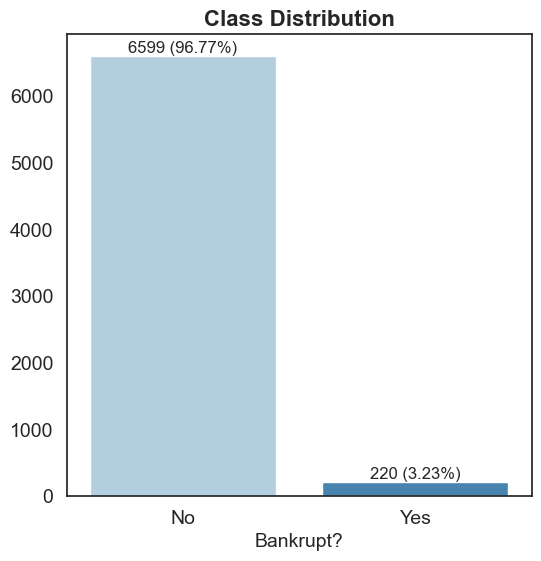

In [14]:
sns.set(rc={'figure.figsize':(6,6)})
sns.set_style('white')

sns.countplot(br, x = 'Bankrupt?', palette='Blues')
abs_values = br['Bankrupt?'].value_counts(ascending=False)
rel_values = br['Bankrupt?'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.2f}%)' for p in zip(abs_values, rel_values)]
ax = plt.gca()
ax.set_xlabel('Bankrupt?', fontsize=14)
ax.set_ylabel('')
ax.set_xticklabels(['No','Yes'], fontsize=14)
ax.yaxis.set_tick_params(labelsize=14)
ax.bar_label(container=ax.containers[0], labels=lbls)
ax.set_title('Class Distribution', fontdict={'size':16, 'weight':'bold'});

plt.savefig('imba.png')

<font color=red>This is a highly __imbalanced__ dataset. The positive cases constitute only 3.23% of the total instances.</font>

A glance of the features:

In [15]:
br.columns

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

<font color = 'blue'> All features are financial ratios, which are calculated using quantitative data from a company's financial statements, and provide insights and important information on the company's performance, profitability, and financial health.</font>

Cleaning up the column names:
1. Remove the whitespace at the beginning of the column name
2. Replace the divide symbol ('/') with 'to', making the format consistent

In [16]:
# Remove the whitespace at the beginning of the column name
# Replace the divide symbol ('/') with 'to'
br.columns = (br.columns.str.strip()).str.replace('/', ' to ')
br.columns

Index(['Bankrupt?', 'ROA(C) before interest and depreciation before interest',
       'ROA(A) before interest and % after tax',
       'ROA(B) before interest and depreciation after tax',
       'Operating Gross Margin', 'Realized Sales Gross Margin',
       'Operating Profit Rate', 'Pre-tax net Interest Rate',
       'After-tax net Interest Rate',
       'Non-industry income and expenditure to revenue',
       'Continuous interest rate (after tax)', 'Operating Expense Rate',
       'Research and development expense rate', 'Cash flow rate',
       'Interest-bearing debt interest rate', 'Tax rate (A)',
       'Net Value Per Share (B)', 'Net Value Per Share (A)',
       'Net Value Per Share (C)', 'Persistent EPS in the Last Four Seasons',
       'Cash Flow Per Share', 'Revenue Per Share (Yuan ¥)',
       'Operating Profit Per Share (Yuan ¥)',
       'Per Share Net profit before tax (Yuan ¥)',
       'Realized Sales Gross Profit Growth Rate',
       'Operating Profit Growth Rate', 'After-

The Correlation heatmap of the dataset:

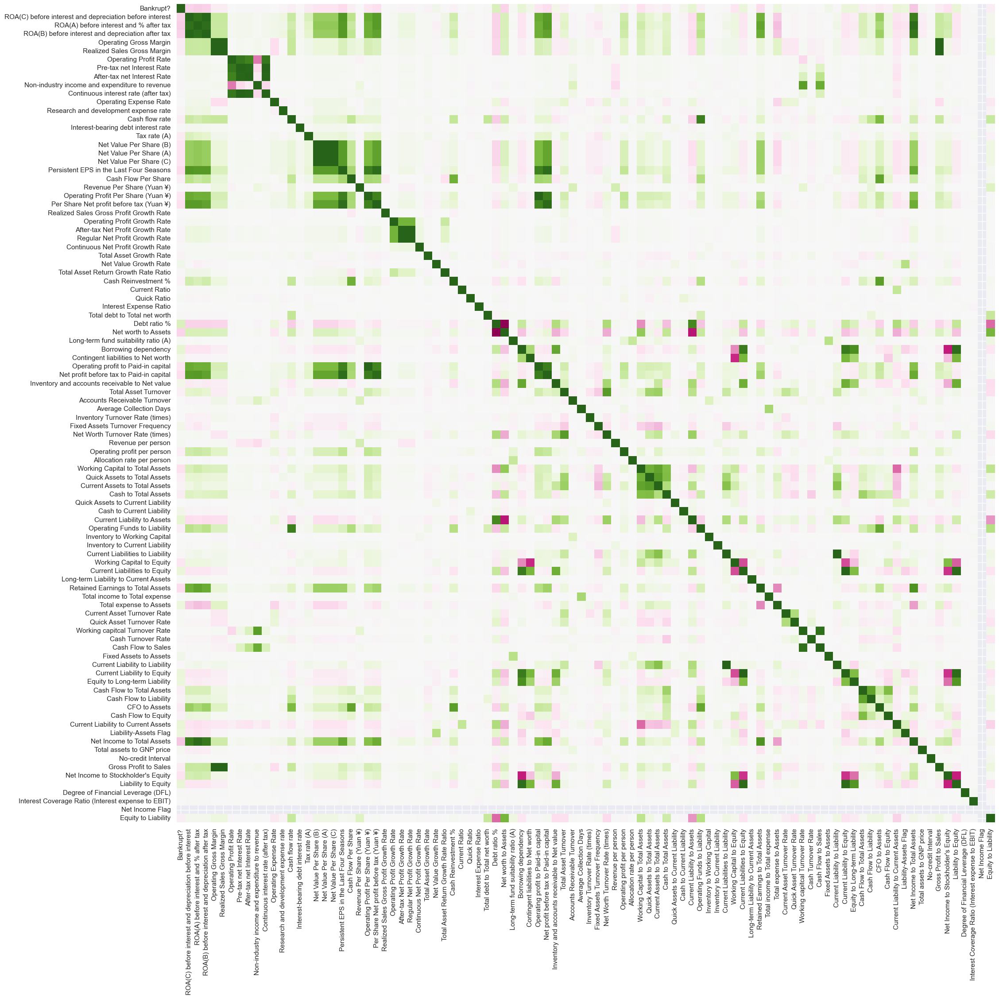

In [17]:
sns.set(rc={'figure.figsize':(24,24)})
sns.heatmap(br.corr(), square = True, vmin = -1.0, vmax = 1.0, center = 0.0, cbar = False, annot = False, cmap = 'PiYG'); 

<font color=blue>Some feature pairs have very strong posisitve or negative correlation, and some features have weak correlation with the target. We will look into the details of the features in the next step.</font>

Save a copy of the original dataframe:

In [18]:
br_copy = br.copy()

### 1.2 Altman z-score model

The Altman z-score is one of the most famous banruptcy prediction model. Z-score is a linear combination of five financial ratios, weighted by coefficients.  
The basic z-score formula is as follows:

__Z = 1.2X1 + 1.4X2 + 3.3X3 + 0.6X4 + 1.0X5__  
> X1 = ratio of working capital to total assets.   
> X2 = ratio of retained earnings to total assets.  
> X3 = ratio of earnings before interest and taxes to total assets.   
> X4 = ratio of market value of equity to book value of total liabilities.   
> X5 = ratio of sales to total assets.  

<font color ='green'>In this dataset, we can find five features that are the same as or very similar to the financial ratios in the z-score formular: </font>  
- `Working Capital to Total Assets` 
- `Retained Earnings to Total Assets` 
- `ROA(A) before interest and % after tax` 
- `Equity to Liability` 
- `Total Asset Turnover`

<font color ='blue'>We calculate the Altman z-score from these ratios and set the classfication threshold to the value that achieves the highest accuracy. Accuracy is the percentage of correct predictions made by a model.  
    $$ \text{Accuracy} = \frac{\text{Number of Correct Predictions}}{\text{Total Number of Predictions}} = \frac{\text{True Negatives + True Positives}}{\text{True Negatives + False Positives + False Negatives + True Positives}} $$
  (The observation having a z-score lower than the threshold are classified as 'Yes' (Bankrupt).)  
  The resulting model performance scores are the baseline predictions of this project.</font>  

Subset the dataset using the above-mentioned ratios:

In [19]:
altman = ['Bankrupt?', 'Working Capital to Total Assets', 'Retained Earnings to Total Assets', 'ROA(A) before interest and % after tax', 'Equity to Liability', 'Total Asset Turnover']
altman_df = br[altman]

<font color = 'green'>We can see that the financial ratios are normalised to the range [0,1].</font>

Calculate the z-score:

In [20]:
pd.set_option('mode.chained_assignment', None)
altman_df['Altman'] = 1.2 * altman_df['Working Capital to Total Assets'] + \
                      1.4 * altman_df['Retained Earnings to Total Assets'] + \
                      3.3 * altman_df['ROA(A) before interest and % after tax'] + \
                      0.6 * altman_df['Equity to Liability'] + \
                      1.0 * altman_df['Total Asset Turnover'] 
altman_df.describe()

,Bankrupt?,Working Capital to Total Assets,Retained Earnings to Total Assets,ROA(A) before interest and % after tax,Equity to Liability,Total Asset Turnover,Altman
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000
mean,0.032263,0.814125,0.934733,0.558625,0.047578,0.141606,4.299191
std,0.176710,0.059054,0.025564,0.065620,0.050014,0.101145,0.317492
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.188020
25%,0.000000,0.774309,0.931097,0.535543,0.024477,0.076462,4.138253
50%,0.000000,0.810275,0.937672,0.559802,0.033798,0.118441,4.295851
75%,0.000000,0.850383,0.944811,0.589157,0.052838,0.176912,4.470857
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.057271


<font color='green'>The lowest z-score is 1.188.</font>

Optimise the classification threshold to achieve the highest accuracy:

In [21]:
X = altman_df['Altman'] 
y = altman_df['Bankrupt?']

In [22]:
best = 0
threshold = 1.188

for c in np.arange(1.188, 3.98, 0.1):
    brpt = (X < c).to_numpy().astype(int)
    correct = (brpt == y).to_numpy().astype(int)
    acc = correct.sum()/len(y)
    if acc > best:
        best = acc
        threshold = c

In [23]:
print('Best accuracy:' + str(round(best,4)) + '\n' + 'Threshold: ' + str(round(threshold,4)))

Best accuracy:0.9682
Threshold: 3.188


Apply the model:

In [24]:
brpt = (X < threshold).to_numpy().astype(int)

A confusion matrix shows how many prediction are correct and incorrect per class. 

Calculate the confusion matrix:

In [25]:
from sklearn.metrics import confusion_matrix

Helper function to plot confusion matrix:

In [26]:
def conf_plot(conf):
    conf_names = ['True Negative', 'False Posistive', 'False Negative', 'True Positive']
    conf_counts = ['{0:0.0f}'.format(value) for value in conf.ravel()]
    labels = [f'{v1}\n{v2}' for v1, v2 in zip(conf_names, conf_counts)]
    labels = np.array(labels).reshape(2,2)
    sns.set(rc={'figure.figsize':(6,6)})
    ax = sns.heatmap(conf, annot = labels, fmt='', cmap = 'Blues', cbar=False, annot_kws={"size": 18})
    ax.set_xlabel('Predicted', fontsize=18)
    ax.set_xticklabels(['No', 'Yes'], fontdict={'size': 14, 'weight': 'bold'})    
    ax.set_ylabel('Actual', fontsize=18)
    ax.set_yticklabels(['No', 'Yes'], fontdict={'size': 14, 'weight': 'bold'})
    ax.set_title('Bankrupt?', fontdict={'size': 18, 'weight': 'bold'})

The confusion matrix of Altman z-score model:

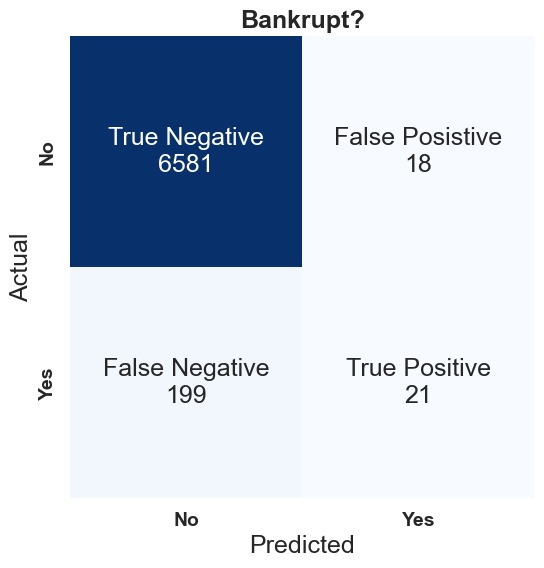

In [27]:
conf_mat = confusion_matrix(y, brpt)
conf_plot(conf_mat);

<font color='blue'>From the total 220 bancruptcy cases, the Altman z-score model identifies 12.</font>

<font color = 'red'>Bankruptcy represents only 3.23% of this dataset. When dealing with a highly imbalanced dataset like this, accuracy is usually not a good performance metric, because if the model simply classifies every instance as "Not Bankrupt", the accuracy score would be 96.77%.

<font color = 'red'>For this project, it is extremely important to capture as many bankrupt(positive) cases as possible, because classifying a company as not going bankrupt but in fact it does may cause disastrous economic losses. On the contrary, if a company is financial stable but classified as bankrupt, the consequence would not be as serious as the previous mistake. In other word, false negatives (type II error) are much more harmful than false positives (type I error), therefore we have to prioritize __recall__, which is the number of true positives divided by the total number of actual positives (i.e., the sum of true positives and false negatives).
    $$ \text{Recall} = \frac{\text{True Positives}}{\text{Actual Positives}} = \frac{\text{True Positives}}{\text{True Positives + False Negatives}} $$
    
<font color = 'red'>On the premises of a decent recall, we also want to minimise false positives as well. Thus we use __f1 score__ as our secondary performance metrics, which is the number of true positives divided by the sum of true positives and the average of false negatives and false positives. F1 score conveys the balance between false positives and false negatives.
    $$ \text{F1 Score} = \frac{\text{True Positives}}{\text{True Positives + $$$\frac{\text{1}}{\text{2}}$$$ (False Negatives + False Positives)}} $$  
<font color = 'red'>F1 score can also be calculated as the harmonic mean of the precision and recall. Precision is the number of true positives divided by the total number of predicted positives (i.e., the sum of true positives and false positives).
    $$ \text{Precision} = \frac{\text{True Positives}}{\text{Predicted Positives}} = \frac{\text{True Positives}}{\text{True Positives + False Positives}} $$
    $$ \text{F1 Score} = \frac{\text{2}}{\text{$$$\frac{\text{1}}{\text{Presision}}$$$ + $$$\frac{\text{1}}{\text{Recall}}$$$ }} $$  </font>

Calculate the performance metrics:

Helper function to calculate accuracy, recall, specificity, precision and f1 score:

In [29]:
def scores(TN, FP, FN, TP): 
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    recall = TP / (FN + TP)
    specificity = TN / (TN + FP)
    precision = TP / (TP + FP)
    f1 = TP / (TP + 0.5 * (FN + FP))
    return accuracy, recall, specificity, precision, f1

The performance scores of Altman z-score model:

In [30]:
TN, FP, FN, TP = conf_mat.ravel()
accuracy, recall, specificity, precision, f1 = scores(TN, FP, FN, TP)
print('Altman z-score model')
print('Accuracy: ', round(accuracy,4))
print('Recall: ', round(recall,4))
print('Specificity: ', round(specificity,4))
print('Precision: ', round(precision,4))
print('F1 score: ', round(f1,4))

Altman z-score model
Accuracy:  0.9682
Recall:  0.0955
Specificity:  0.9973
Precision:  0.5385
F1 score:  0.1622


<font color='blue'>The baseline prediction of our model is:  
__Recall__:  0.0909   
__F1 score__:  0.1550</font>

## __2. Data Cleaning and Exploratory Data Analysis (EDA)__

### 2.0 Data cleaning and EDA of different feature categories

There are 95 features in the dataset. All features are financial ratios. To obtain more information on the data, we divided the features into seven categories.
- __Solvency__
- __Capital structure__
- __Turnover__
- __Cash flow__
- __Profitability__
- __Growth__
- __Others__

#### 2.0.0 Financial ratio categories

List of solvency ratios:

In [31]:
solvency = [
       'Interest-bearing debt interest rate',
       'Cash Reinvestment %',
       'Current Ratio', 
       'Quick Ratio', 
       'Interest Expense Ratio',
       'Total debt to Total net worth', 
       'Debt ratio %', 
       'Borrowing dependency',
       'Contingent liabilities to Net worth',
       'Operating profit to Paid-in capital',
       'Net profit before tax to Paid-in capital',
       'Working Capital to Total Assets', 
       'Quick Assets to Total Assets',
       'Current Assets to Total Assets', 
       'Cash to Total Assets',
       'Quick Assets to Current Liability', 
       'Cash to Current Liability',
       'Current Liability to Assets', 
       'Operating Funds to Liability',
       'Inventory to Working Capital', 
       'Inventory to Current Liability',
       'Current Liabilities to Liability', 
       'Working Capital to Equity',
       'Current Liabilities to Equity', 
       'Long-term Liability to Current Assets',
       'Current Liability to Current Assets',
       'Liability-Assets Flag',
       'Equity to Liability'
]

len(solvency)

28

List of capital structure ratios:

In [32]:
capital_structure = [ 
    'Net worth to Assets',
    'Long-term fund suitability ratio (A)',
    'Fixed Assets to Assets',
    'Current Liability to Liability', 
    'Current Liability to Equity',
    'Equity to Long-term Liability',
    'Liability to Equity',
    'Degree of Financial Leverage (DFL)',
    'Interest Coverage Ratio (Interest expense to EBIT)'
]

len(capital_structure)

9

List of turnover ratios:

In [33]:
turnover = [
       'Inventory and accounts receivable to Net value',    
       'Total Asset Turnover',
       'Accounts Receivable Turnover', 
       'Average Collection Days',
       'Inventory Turnover Rate (times)', 
       'Fixed Assets Turnover Frequency',
       'Net Worth Turnover Rate (times)', 
       'Current Asset Turnover Rate',
       'Quick Asset Turnover Rate', 
       'Working capitcal Turnover Rate',
       'Cash Turnover Rate', 
       'Cash Flow to Sales',
       'No-credit Interval'
       ]

len(turnover)

13

List of cash flow ratios:

In [34]:
cashflow = [
       'Cash flow rate', 
       'Cash Flow to Total Assets',
       'Cash Flow to Liability', 
       'CFO to Assets', 
       'Cash Flow to Equity',
] 
len(cashflow)

5

List of profitability ratios:

In [35]:
profitability = [
    'ROA(C) before interest and depreciation before interest',
    'ROA(A) before interest and % after tax',
    'ROA(B) before interest and depreciation after tax',
    'Operating Gross Margin', 
    'Realized Sales Gross Margin',
    'Operating Profit Rate', 
    'Pre-tax net Interest Rate',
    'After-tax net Interest Rate',
    'Non-industry income and expenditure to revenue',
    'Continuous interest rate (after tax)', 
    'Persistent EPS in the Last Four Seasons',     
    'Per Share Net profit before tax (Yuan ¥)', 
    'Retained Earnings to Total Assets', 
    'Total income to Total expense', 
    'Total expense to Assets', 
    'Net Income to Total Assets',
    'Gross Profit to Sales',
    'Net Income to Stockholder\'s Equity',
    'Net Income Flag'  
   ]

len(profitability)

19

List of growth ratios:

In [36]:
growth = [
    'Realized Sales Gross Profit Growth Rate',
    'Operating Profit Growth Rate', 
    'After-tax Net Profit Growth Rate',
    'Continuous Net Profit Growth Rate',
    'Regular Net Profit Growth Rate', 
    'Total Asset Growth Rate', 
    'Net Value Growth Rate',
    'Total Asset Return Growth Rate Ratio'
]

len(growth)

8

List of other ratios:

In [37]:
others = [
       'Operating Expense Rate',
       'Research and development expense rate', 
       'Tax rate (A)',
       'Net Value Per Share (B)', 
       'Net Value Per Share (A)',
       'Net Value Per Share (C)',
       'Cash Flow Per Share', 
       'Revenue Per Share (Yuan ¥)',
       'Operating Profit Per Share (Yuan ¥)',
       'Revenue per person',
       'Operating profit per person', 
       'Allocation rate per person',
       'Total assets to GNP price'
]

len(others)

13

Check the combined length of the seven feature lists to ensure all features are covered:

In [38]:
assert len(solvency)+len(capital_structure)+len(turnover)+len(cashflow)+len(profitability)+len(growth)+len(others) == 95

Next we clean the data and do some feature engineering for each financial ratio category.

#### 2.0.1 Solvency ratios

Subset the dataframe using solvency ratios:

In [39]:
solvency.append('Bankrupt?')

In [40]:
br_solvency = br[solvency]
br_solvency.head()

,Interest-bearing debt interest rate,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt to Total net worth,Debt ratio %,Borrowing dependency,Contingent liabilities to Net worth,Operating profit to Paid-in capital,Net profit before tax to Paid-in capital,Working Capital to Total Assets,Quick Assets to Total Assets,Current Assets to Total Assets,Cash to Total Assets,Quick Assets to Current Liability,Cash to Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory to Working Capital,Inventory to Current Liability,Current Liabilities to Liability,Working Capital to Equity,Current Liabilities to Equity,Long-term Liability to Current Assets,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
0,0.000725,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.390284,0.006479,0.095885,0.137757,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.118250,0,0.016469,1
1,0.000647,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.376760,0.005835,0.093743,0.168962,0.751111,0.127236,0.182419,0.014948,0.004136,1.383910e-03,0.056963,0.341106,0.289642,0.005210,0.308589,0.731975,0.329740,0.023947,0.047775,0,0.020794,1
2,0.000790,0.368913,0.011543,0.005348,0.629631,0.021248,0.207516,0.379093,0.006562,0.092318,0.148036,0.829502,0.340201,0.602806,0.000991,0.006302,5.340000e+09,0.098162,0.336731,0.277456,0.013879,0.446027,0.742729,0.334777,0.003715,0.025346,0,0.016474,1
3,0.000449,0.384077,0.004194,0.002896,0.630228,0.009572,0.151465,0.379743,0.005366,0.077727,0.147561,0.725754,0.161575,0.225815,0.018851,0.002961,1.010646e-03,0.098715,0.348716,0.276580,0.003540,0.615848,0.729825,0.331509,0.022165,0.067250,0,0.023982,1
4,0.000686,0.379690,0.006022,0.003727,0.636055,0.005150,0.106509,0.375025,0.006624,0.096927,0.167461,0.751822,0.260330,0.358380,0.014161,0.004275,6.804636e-04,0.110195,0.344639,0.287913,0.004869,0.975007,0.732000,0.330726,0.000000,0.047725,0,0.035490,1


Descriptive statistics:

In [41]:
br_solvency.describe()

,Interest-bearing debt interest rate,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt to Total net worth,Debt ratio %,Borrowing dependency,Contingent liabilities to Net worth,Operating profit to Paid-in capital,Net profit before tax to Paid-in capital,Working Capital to Total Assets,Quick Assets to Total Assets,Current Assets to Total Assets,Cash to Total Assets,Quick Assets to Current Liability,Cash to Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory to Working Capital,Inventory to Current Liability,Current Liabilities to Liability,Working Capital to Equity,Current Liabilities to Equity,Long-term Liability to Current Assets,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
count,6.819000e+03,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000
mean,1.644801e+07,0.379677,4.032850e+05,8.376595e+06,0.630991,4.416337e+06,0.113177,0.374654,0.005968,0.108977,0.182715,0.814125,0.400132,0.522273,0.124095,3.592902e+06,3.715999e+07,0.090673,0.353828,0.277395,5.580680e+07,0.761599,0.735817,0.331410,5.416004e+07,0.031506,0.001173,0.047578,0.032263
std,1.082750e+08,0.020737,3.330216e+07,2.446847e+08,0.011238,1.684069e+08,0.053920,0.016286,0.012188,0.027782,0.030785,0.059054,0.201998,0.218112,0.139251,1.716209e+08,5.103509e+08,0.050290,0.035147,0.010469,5.820516e+08,0.206677,0.011678,0.013488,5.702706e+08,0.030845,0.034234,0.050014,0.176710
min,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,2.030203e-04,0.374749,7.555047e-03,4.725903e-03,0.630612,3.007049e-03,0.072891,0.370168,0.005366,0.096105,0.169376,0.774309,0.241973,0.352845,0.033543,5.239776e-03,1.973008e-03,0.053301,0.341023,0.277034,3.163148e-03,0.626981,0.733612,0.328096,0.000000e+00,0.018034,0.000000,0.024477,0.000000
50%,3.210321e-04,0.380425,1.058717e-02,7.412472e-03,0.630698,5.546284e-03,0.111407,0.372624,0.005366,0.104133,0.178456,0.810275,0.386451,0.514830,0.074887,7.908898e-03,4.903886e-03,0.082705,0.348597,0.277178,6.497335e-03,0.806881,0.736013,0.329685,1.974619e-03,0.027597,0.000000,0.033798,0.000000
75%,5.325533e-04,0.386731,1.626953e-02,1.224911e-02,0.631125,9.273293e-03,0.148804,0.376271,0.005764,0.115927,0.191607,0.850383,0.540594,0.689051,0.161073,1.295091e-02,1.280557e-02,0.119523,0.360915,0.277429,1.114677e-02,0.942027,0.738560,0.332322,9.005946e-03,0.038375,0.000000,0.052838,0.000000
max,9.900000e+08,1.000000,2.750000e+09,9.230000e+09,1.000000,9.940000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.820000e+09,9.650000e+09,1.000000,1.000000,1.000000,9.910000e+09,1.000000,1.000000,1.000000,9.540000e+09,1.000000,1.000000,1.000000,1.000000


<font color=blue>Most of the features range from 0 to 1, but a few have extremely large max values(in the order of magnitude of 10e9)</font> <br>
<font color=red>According to the source paper, each financial ratio is normalized to the range of 0 to 1.<br>
Therefore the values less than 0 or larger than 1 are erroneous. __They should be treated as missing values.__ </font>

Mark missing values (i.e., less than 0 or larger than 1) as NA:

In [42]:
br_solvency = br_solvency.where(br_solvency <= 1, np.nan) # no value is less than 0 in this subset
br = br.where(((br >= 0) & (br <= 1)), np.nan)

Save a copy of the full dataset:

In [43]:
br_copy_0 = br.copy()

After removing the erroneous values, check the correlation between each feature and the target:

In [44]:
corr_df = pd.DataFrame(br.corrwith(br['Bankrupt?']))
corr_df.columns = ['Correlation']
corr_df['Abs_corr'] = np.abs(corr_df['Correlation'])
corr_df.iloc[1:].describe()

,Correlation,Abs_corr
count,94.000000,94.000000
mean,-0.033164,0.085155
std,0.113974,0.082294
min,-0.315457,0.000230
25%,-0.091227,0.009678
50%,-0.015880,0.067914
75%,0.002369,0.141816
max,0.250161,0.315457


The histogram of correlation coefficients with the target (in absolute value):

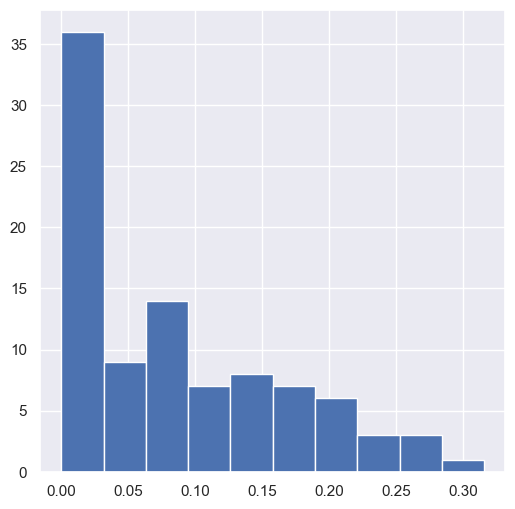

In [45]:
sns.set(rc={'figure.figsize':(6,6)})
corr_df.iloc[1:]['Abs_corr'].hist();

<font color = blue> Most features have a weak or negligible correlation with the target. </font> 

For the solvency ratio subset, check the number of missing values in each feature:

In [46]:
br_solvency.isnull().sum()

Interest-bearing debt interest rate         221
Cash Reinvestment %                           0
Current Ratio                                 1
Quick Ratio                                   9
Interest Expense Ratio                        0
Total debt to Total net worth                 8
Debt ratio %                                  0
Borrowing dependency                          0
Contingent liabilities to Net worth           0
Operating profit to Paid-in capital           0
Net profit before tax to Paid-in capital      0
Working Capital to Total Assets               0
Quick Assets to Total Assets                  0
Current Assets to Total Assets                0
Cash to Total Assets                          0
Quick Assets to Current Liability             3
Cash to Current Liability                    46
Current Liability to Assets                   0
Operating Funds to Liability                  0
Inventory to Working Capital                  0
Inventory to Current Liability          

List of columns that contain missing values:

A helper function for drawing heatmaps in a uniform format:

In [47]:
def FRheatmap(df, size=18, annot_size=8, cbar=True):
    sns.set(rc={'figure.figsize':(size, size)})
    sns.heatmap(df.corr(), square = True, vmin = -1.0, vmax = 1.0, center = 0.0, annot = True, fmt='.2f', cmap = 'PiYG', cbar = cbar, annot_kws={'size':8}, cbar_kws={'shrink': .8}); 

Check the correlation:

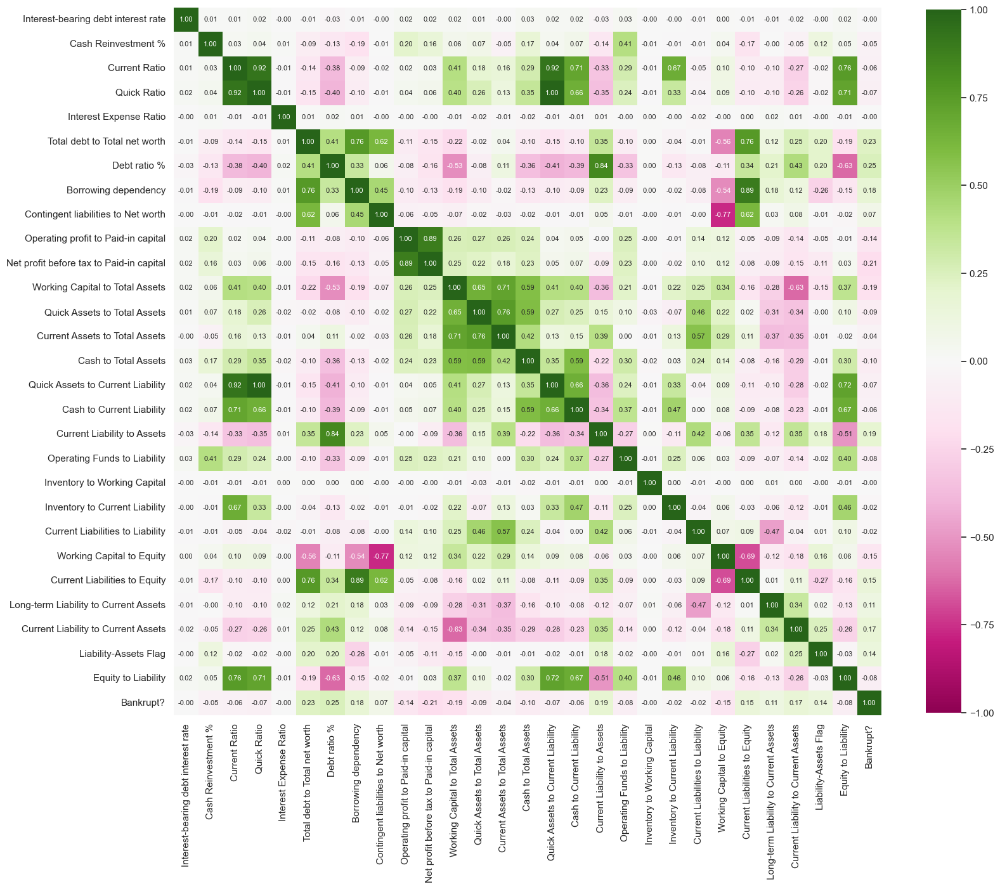

In [48]:
FRheatmap(br_solvency)

<font color=blue>In the following data cleaning process, the main principles of dealing with missing values are as follows:</font>
- <font color=blue>If a feature has a large number of missing values, and its correlation with the target is negligible, we drop this feature. The rough criteria of negligible correlation is the absolute value of the correlation coefficient is less than 0.10.</font>
- <font color=blue>If a feature has a small number of missing values, and the positive rate of label for the records with missing values is not significant higher than that for the full dataset, we drop the records with missing values.</font>

| Column | <div style="width:100px"> Number of missing values </div> | <div style="width:100px">Correlation with the target </div>|
| :-: | :-: | :-: |
| Interest-bearing debt interest rate | 221 | -0.00 |
| Inventory to Current Liability | 99 | - 0.02 | 
| Long-term Liability to Current Assets | 109 | - 0.11 | 

<font color = green>The columns `Interest-bearing debt interest rate`, `Inventory to Current Liability` and `Long-term Liability to Current Assets` have many missing values, and their correlations with the target is negligible or very weak, so we drop these columns:</font>

In [49]:
drop_columns = ['Interest-bearing debt interest rate', 
                'Inventory to Current Liability', 
                'Long-term Liability to Current Assets']

In [50]:
br_solvency = br_solvency.drop(drop_columns, axis = 1)
br = br.drop(drop_columns, axis = 1)

| Column | <div style="width:100px"> Number of missing values </div> | <div style="width:100px">Correlation with the target </div>|
| :-: | :-: | :-: |
| Current Ratio | 1 | -0.06 |
| Quick Ratio | 9 | - 0.07 | 
| Total debt to Total net worth | 8 | 0.23 | 
| Quick Assets to Current Liability | 3 | - 0.07 | 
| Cash to Current Liability | 46 | - 0.06 | 
| Long-term Liability to Current Assets | 109 | - 0.11 | 

<font color=green>The columns `Current Ratio`, `Quick Ratio` and `Quick Assets to Current Liability` have a small number of missing values. However, the columns `Current Ratio`, `Quick Ratio` and `Quick Assets to Current Liability` have strong pairwise correlations. This is not suprising because the formula for `Current Ratio` and `Quick Ratio` are:</font>
$$
  \text{Current Ratio} = \frac{\text{Current Assets}}{\text{Current Liabilities}} =  \frac{\text{Cash + Accounts Receivable + Inventory}}{\text{Current Liabilities}}
$$
<br>
$$
  \text{Quick Ratio} = \frac{\text{Quick Assets}}{\text{Current Liabilities}} =  \frac{\text{Cash + Accounts Receivable}}{\text{Current Liabilities}}
$$

<font color=green>Hence, `Quick Ratio` and `Quick Assets to Current Liability` are virtually the same, and `Quick Ratio` or `Quick Assets to Current Liability` is a proportion of `Current Ratio`. Since `Quick Assets to Current Liability` has the least number of missing values, and we have seen `Inventory to Current Liability`, the difference between `Current Ratio` and `Quick Ratio`, has a negligible correlation with the target, we drop the `Current Ratio` and `Quick Ratio` columns: </font>

In [51]:
drop_columns = ['Current Ratio',
                'Quick Ratio']

In [52]:
br_solvency = br_solvency.drop(drop_columns, axis = 1)
br = br.drop(drop_columns, axis = 1)

Check the instances with missing values in `Quick Assets to Current Liability`:

In [53]:
br_solvency[br_solvency['Quick Assets to Current Liability'].isnull()]

,Cash Reinvestment %,Interest Expense Ratio,Total debt to Total net worth,Debt ratio %,Borrowing dependency,Contingent liabilities to Net worth,Operating profit to Paid-in capital,Net profit before tax to Paid-in capital,Working Capital to Total Assets,Quick Assets to Total Assets,Current Assets to Total Assets,Cash to Total Assets,Quick Assets to Current Liability,Cash to Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory to Working Capital,Current Liabilities to Liability,Working Capital to Equity,Current Liabilities to Equity,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
2063,0.385679,0.632894,0.008267,0.140551,0.378151,0.005378,0.107732,0.183621,0.861228,0.012452,0.878882,0.015447,NaN,0.000556,0.147365,0.346231,0.278049,0.996929,0.740619,0.333579,0.026161,0,0.026120,0
2168,0.347416,0.632479,0.018772,0.199534,0.384972,0.005505,0.114661,0.183229,0.796630,0.021338,0.840226,0.006634,NaN,0.000169,0.207915,0.333025,0.279411,0.998851,0.737717,0.342885,0.038701,0,0.017292,0
2735,0.319493,0.630437,0.194535,0.312755,0.187124,0.005366,0.072858,0.146316,0.475181,0.035045,0.044384,0.031474,NaN,0.000516,0.323917,0.336138,0.276969,0.999817,0.961070,0.153811,1.000000,1,0.009546,0


<font color = green> All of these records are negative cases. We keep the `Quick Assets to Current Liability` column and drop the records with missing values.</font>

Check the instances with missing values in `Total debt to Total net worth`:

In [54]:
br_solvency[br_solvency['Total debt to Total net worth'].isnull()]

,Cash Reinvestment %,Interest Expense Ratio,Total debt to Total net worth,Debt ratio %,Borrowing dependency,Contingent liabilities to Net worth,Operating profit to Paid-in capital,Net profit before tax to Paid-in capital,Working Capital to Total Assets,Quick Assets to Total Assets,Current Assets to Total Assets,Cash to Total Assets,Quick Assets to Current Liability,Cash to Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory to Working Capital,Current Liabilities to Liability,Working Capital to Equity,Current Liabilities to Equity,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
1171,0.384635,0.630523,NaN,0.001088,0.369637,0.005366,0.089501,0.164369,0.832588,0.324831,0.311196,0.025664,0.107927,0.024197,0.005163,0.585877,0.276975,1.000000,0.735334,0.326312,0.002507,0,0.798122,1
2200,0.406226,0.630770,NaN,0.003144,0.369637,0.005366,0.092595,0.170417,0.982632,0.333867,0.850923,0.241425,0.198357,0.406982,0.002677,1.000000,0.277289,0.398022,0.741654,0.326246,0.000279,0,0.580688,0
2247,0.391332,0.630607,NaN,0.001874,0.369637,0.005366,0.095290,0.166835,0.951094,0.286455,0.742887,0.313434,0.100846,0.312226,0.004861,0.728289,0.277295,0.826727,0.740295,0.326304,0.000825,0,0.698967,0
2296,0.377352,0.630609,NaN,0.000272,0.369637,0.005366,0.094037,0.168260,0.952622,0.291799,0.739108,0.160730,0.222624,0.346830,0.001987,0.380521,0.277287,0.507696,0.740312,0.326227,0.000220,0,0.942729,0
2345,0.387709,0.630532,NaN,0.000363,0.369637,0.005366,0.093719,0.167295,0.939225,0.323095,0.689581,0.229932,0.266294,0.537210,0.001798,0.732355,0.277251,0.456351,0.739759,0.326222,0.000214,0,0.920638,0
2490,0.372238,0.630605,NaN,0.001512,0.369637,0.006179,0.082075,0.156806,0.818355,0.253038,0.242417,0.000904,1.000000,0.010062,0.000000,0.231268,0.276975,0.063817,0.734745,0.326175,0.000000,0,0.743588,0
3180,0.376085,0.630612,NaN,0.000574,0.369637,0.005366,0.092424,0.167491,0.912683,0.588478,0.599428,0.609513,0.251210,0.745075,0.003873,0.336536,0.277005,0.848498,0.738660,0.326277,0.000834,0,0.881018,0
5288,0.377818,0.630612,NaN,0.002086,0.369637,0.005366,0.100249,0.190008,0.889698,0.529834,0.522945,0.157859,0.148478,0.126563,0.006155,0.492444,0.276990,0.998963,0.737733,0.326339,0.001681,0,0.677340,0


<font color = green> There is a positive case in these records. However `Total debt to Total net worth` has a relatively strong correlation with the target, we still need to keep this column and drop the records with missing values.</font>

Check the descriptive statistics of the instances with missing values in `Cash to Current Liability` :

In [55]:
br_solvency[br_solvency['Cash to Current Liability'].isnull()].describe()

,Cash Reinvestment %,Interest Expense Ratio,Total debt to Total net worth,Debt ratio %,Borrowing dependency,Contingent liabilities to Net worth,Operating profit to Paid-in capital,Net profit before tax to Paid-in capital,Working Capital to Total Assets,Quick Assets to Total Assets,Current Assets to Total Assets,Cash to Total Assets,Quick Assets to Current Liability,Cash to Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory to Working Capital,Current Liabilities to Liability,Working Capital to Equity,Current Liabilities to Equity,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,0.0,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.0,46.000000,46.000000
mean,0.374305,0.635917,0.017898,0.177252,0.385038,0.007062,0.098961,0.166147,0.764601,0.194576,0.536811,0.001590,0.002683,NaN,0.150657,0.342166,0.277771,0.807036,0.732033,0.339025,0.051787,0.0,0.021200,0.326087
std,0.019555,0.027021,0.017360,0.039915,0.012165,0.008649,0.015976,0.018937,0.056760,0.171544,0.269286,0.000958,0.002524,NaN,0.056334,0.009314,0.001717,0.239720,0.010607,0.011730,0.025716,0.0,0.006016,0.473960
min,0.319828,0.618091,0.004489,0.097318,0.372362,0.005366,0.072655,0.132268,0.653619,0.006131,0.098348,0.000184,0.000000,NaN,0.036073,0.325083,0.274090,0.200583,0.676961,0.328300,0.021729,0.0,0.011369,0.000000
25%,0.365048,0.629814,0.009059,0.147361,0.377967,0.005366,0.090173,0.153652,0.727575,0.054907,0.321305,0.000892,0.000649,NaN,0.106568,0.336535,0.276768,0.695114,0.729103,0.332060,0.035093,0.0,0.016685,0.000000
50%,0.374912,0.630855,0.014636,0.182453,0.381327,0.005366,0.096113,0.165549,0.761073,0.121104,0.540124,0.001329,0.001760,NaN,0.155202,0.340295,0.277553,0.926117,0.732987,0.335606,0.042730,0.0,0.019279,0.000000
75%,0.381590,0.632711,0.020557,0.205415,0.386780,0.005859,0.104294,0.176480,0.807476,0.339672,0.779926,0.002111,0.004471,NaN,0.196614,0.346342,0.278357,0.988545,0.737892,0.342032,0.063610,0.0,0.024751,1.000000
max,0.439868,0.812165,0.117225,0.276113,0.441969,0.064164,0.156456,0.222381,0.883812,0.616411,0.988767,0.004086,0.011389,NaN,0.248068,0.378054,0.284364,0.999743,0.743058,0.399419,0.142964,0.0,0.039096,1.000000


<font color = green>The positive rate (32.61%) of these records is significantly higher than that of the whole dataset (3.23%). Since losing the already rare positive cases is undesirable, and the `Cash to Current Liability` has a negligible correlation with the target, we drop the `Cash to Current Liability` column: </font>

In [56]:
drop_columns = ['Cash to Current Liability']

In [57]:
br_solvency = br_solvency.drop(drop_columns, axis = 1)
br = br.drop(drop_columns, axis = 1)

Drop the records with missing values in certain columns:

In [58]:
drop_rows = ['Quick Assets to Current Liability', 
             'Total debt to Total net worth']

In [59]:
mask = br_solvency[drop_rows].isnull().any(axis=1)
br_solvency = br_solvency[~mask]

Check the correlation again:

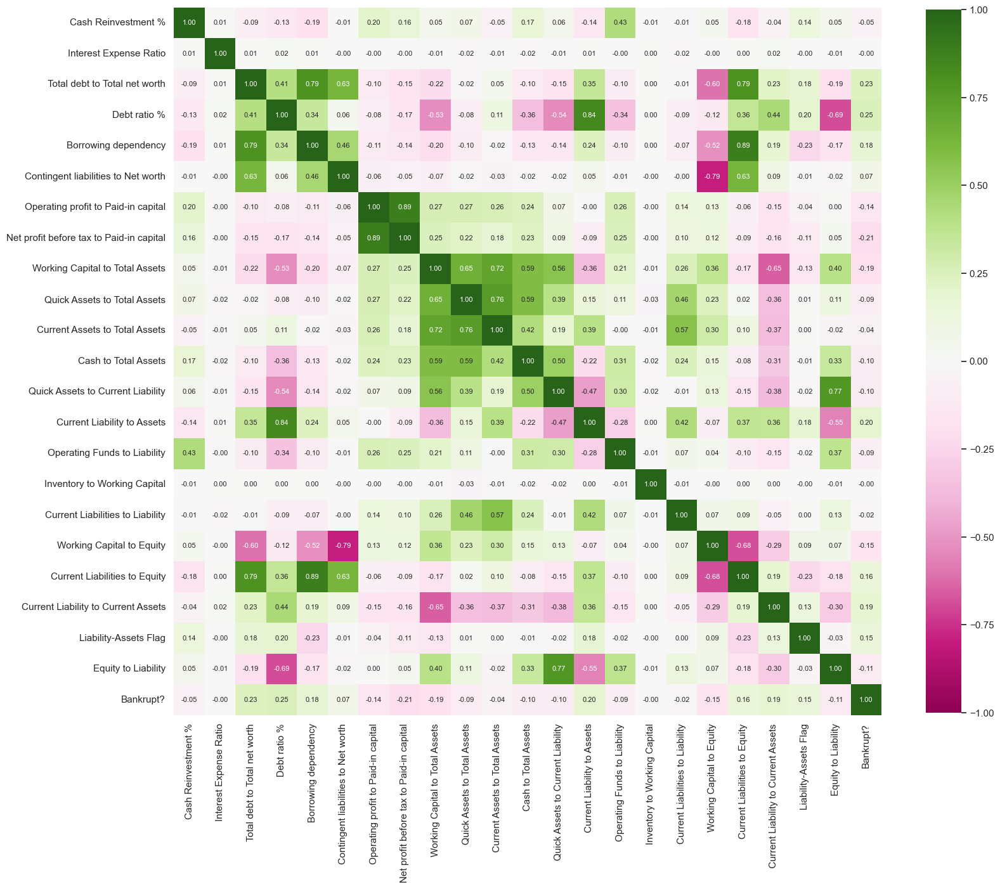

In [60]:
FRheatmap(br_solvency)

Applie the change to the full dataset:

In [61]:
br = br[~mask]

Check the number of features:

In [62]:
br_solvency.shape

(6808, 23)

<font color =  green> After data cleaning and feature engineering we have 22 solvency ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

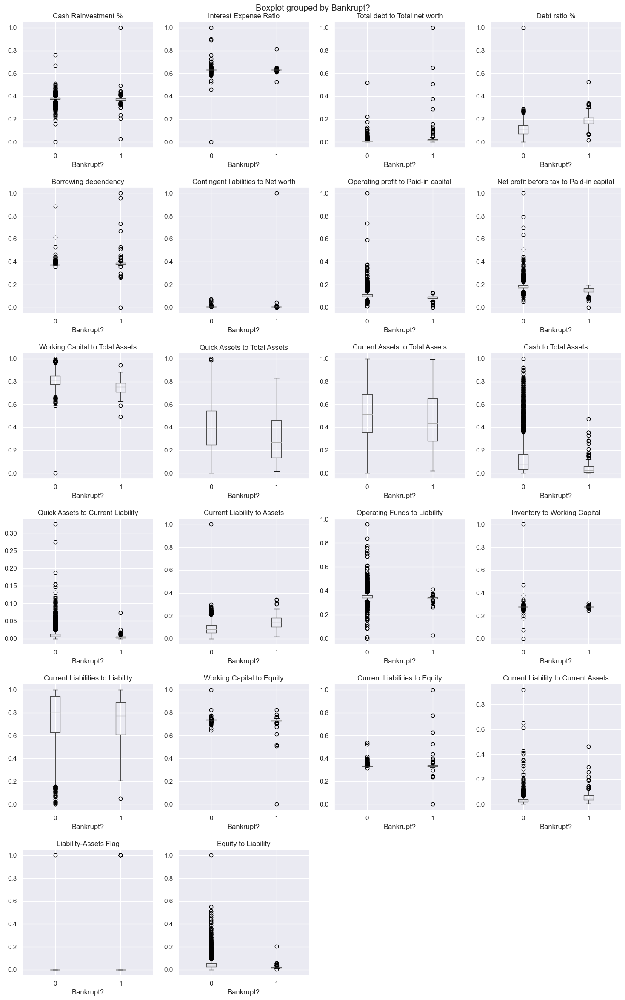

In [63]:
fig, axs = plt.subplots(6, 4, figsize=(15, 24)) 

for column, ax in zip((br_solvency.iloc[:,:-1]).columns, axs.ravel()):
    br_solvency.boxplot(column = column, by = 'Bankrupt?', ax=ax)

fig.delaxes(axs[5][2])
fig.delaxes(axs[5][3])
fig.tight_layout(pad=1.5);

Save a copy of the dataset at this step:

In [64]:
br_copy_1 = br.copy()

#### 2.0.2. Capital Structure

Subset the dataframe using capital structure ratios:

In [65]:
capital_structure.append('Bankrupt?')

In [66]:
br_cap_str = br[capital_structure]
br_cap_str.head()

,Net worth to Assets,Long-term fund suitability ratio (A),Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Bankrupt?
0,0.792424,0.005024,0.424206,0.676269,0.339077,0.126549,0.290202,0.026601,0.564050,1
1,0.828824,0.005059,0.468828,0.308589,0.329740,0.120916,0.283846,0.264577,0.570175,1
2,0.792484,0.005100,0.276179,0.446027,0.334777,0.117922,0.290189,0.026555,0.563706,1
3,0.848535,0.005047,0.559144,0.615848,0.331509,0.120760,0.281721,0.026697,0.564663,1
4,0.893491,0.005303,0.309555,0.975007,0.330726,0.110933,0.278514,0.024752,0.575617,1


Descriptive statistics:

In [67]:
br_cap_str.describe()

,Net worth to Assets,Long-term fund suitability ratio (A),Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Bankrupt?
count,6808.000000,6808.000000,6807.000000,6808.000000,6808.000000,6808.000000,6808.000000,6808.000000,6808.000000,6808.000000
mean,0.886738,0.008720,0.249555,0.761640,0.331440,0.115652,0.280392,0.027542,0.565358,0.032168
std,0.053762,0.027981,0.199922,0.206463,0.013324,0.019544,0.014363,0.015681,0.013225,0.176459
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.851128,0.005244,0.085722,0.627241,0.328102,0.110933,0.276951,0.026791,0.565158,0.000000
50%,0.888457,0.005663,0.196961,0.806856,0.329687,0.112348,0.278781,0.026808,0.565252,0.000000
75%,0.926966,0.006842,0.372200,0.941902,0.332326,0.117112,0.281455,0.026913,0.565725,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Check the number of missing values in each feature:

In [68]:
br_cap_str.isnull().sum()

Net worth to Assets                                   0
Long-term fund suitability ratio (A)                  0
Fixed Assets to Assets                                1
Current Liability to Liability                        0
Current Liability to Equity                           0
Equity to Long-term Liability                         0
Liability to Equity                                   0
Degree of Financial Leverage (DFL)                    0
Interest Coverage Ratio (Interest expense to EBIT)    0
Bankrupt?                                             0
dtype: int64

<font color=green>There is only one missing value in the `Fixed Assets to Assets` column:</font>

Check the correlation:

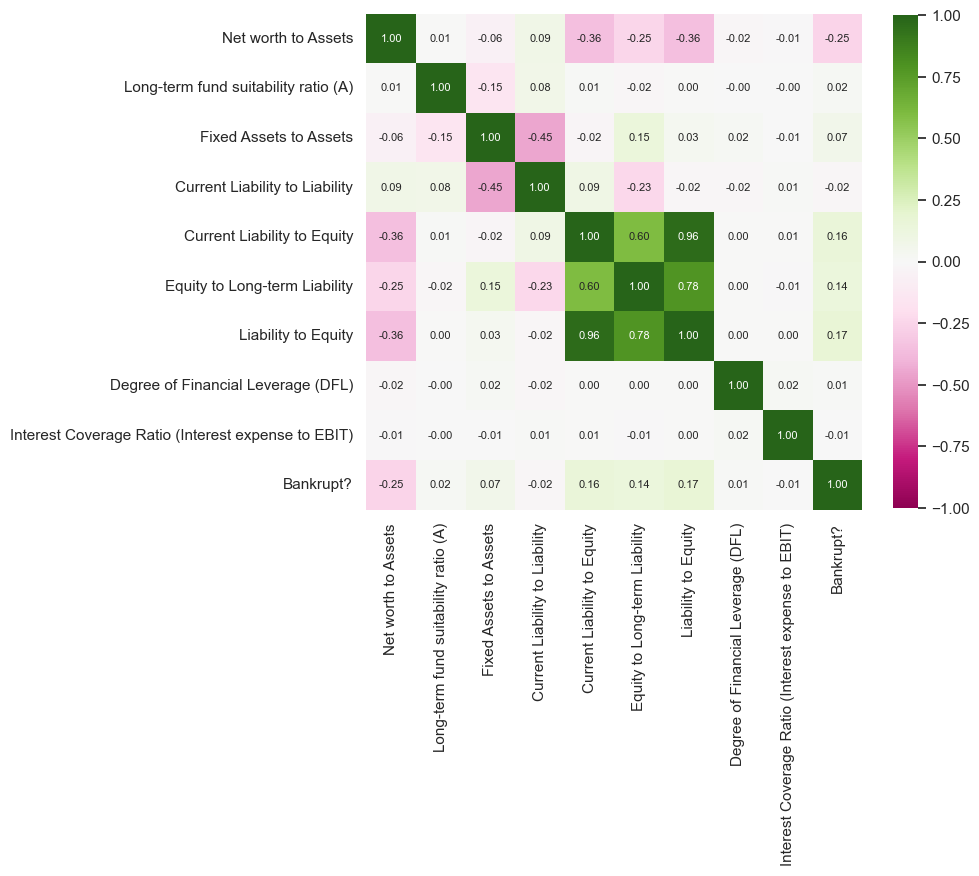

In [69]:
FRheatmap(br_cap_str, 8);

<font color=green>`Current Liability to Equity` and `Liability to Equity` have a strong positivie correlation. This is because $\text{Liability} = \text{Current Liability} + \text{Long-term Liability}$. `Current Liability to Equity` is a proportion of `Liability to Equity`. Since we have the feature `Equity to Long-term Liability`, which represent the reciprocal of `Liability to Equity` - `Current Liability to Equity`, we drop the  `Liability to Equity` column: </font>

In [70]:
br_cap_str = br_cap_str.drop('Liability to Equity', axis = 1)
br = br.drop('Liability to Equity', axis = 1)

Drop the records with missing values in `Fixed Assets to Assets`:

In [71]:
mask = br_cap_str['Fixed Assets to Assets'].isnull()
br_cap_str = br_cap_str[~mask]

Check the correlation again:

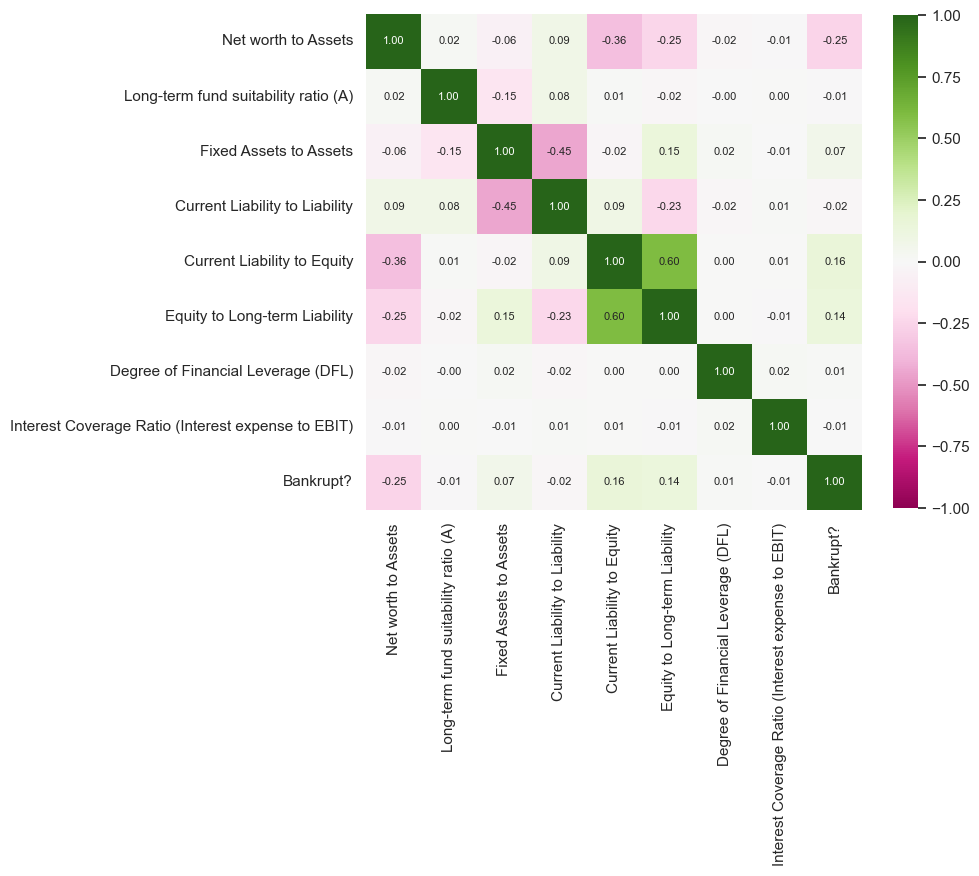

In [72]:
FRheatmap(br_cap_str, 8);

Apply the changes on the full dataset:

In [73]:
br = br[~mask]

Check the number of features:

In [74]:
br_cap_str.shape

(6807, 9)

<font color =  green> After data cleaning and feature engineering we have 8 capital structure ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

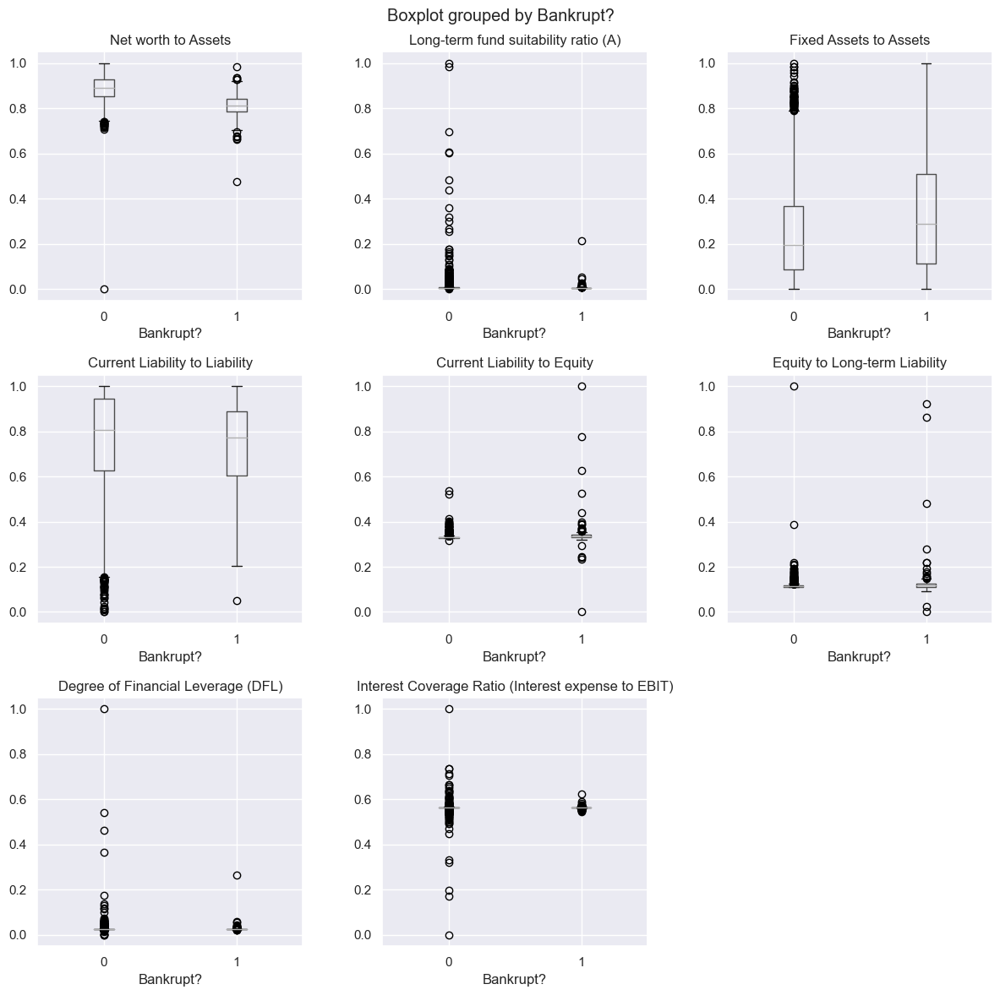

In [75]:
fig, axs = plt.subplots(3, 3, figsize=(12,12)) 

for column, ax in zip((br_cap_str.iloc[:,:-1]).columns, axs.ravel()):
    br_cap_str.boxplot(column = column, by = 'Bankrupt?', ax=ax)

fig.delaxes(axs[2][2])
fig.tight_layout()
fig.subplots_adjust(hspace=0.3, wspace=0.3);

Save a copy of the dataset at this step:

In [76]:
br_copy_2 = br.copy()

#### 2.0.3. Turnover

Subset the dataframe using turnover ratios:

In [77]:
turnover.append('Bankrupt?')

In [78]:
br_turnover = br[turnover]
br_turnover.head()

,Inventory and accounts receivable to Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,No-credit Interval,Bankrupt?
0,0.398036,0.086957,0.001814,0.003487,0.000182,0.000117,0.032903,NaN,NaN,0.593831,NaN,0.671568,0.622879,1
1,0.397725,0.064468,0.001286,0.004917,NaN,NaN,0.025484,0.000107,NaN,0.593916,NaN,0.671570,0.623652,1
2,0.406580,0.014993,0.001495,0.004227,NaN,NaN,0.013387,0.001791,0.001023,0.594502,NaN,0.671571,0.623841,1
3,0.397925,0.089955,0.001966,0.003215,NaN,NaN,0.028065,NaN,NaN,0.593889,NaN,0.671519,0.622929,1
4,0.400079,0.175412,0.001449,0.004367,0.000163,0.000294,0.040161,NaN,NaN,0.593915,NaN,0.671563,0.623521,1


Descriptive statistics:

In [79]:
br_turnover.describe()

,Inventory and accounts receivable to Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,No-credit Interval,Bankrupt?
count,6807.000000,6807.000000,6786.000000,6790.000000,3870.000000,5583.000000,6807.000000,5574.000000,4427.000000,6807.000000,2574.000000,6807.000000,6807.000000,6807.000000
mean,0.402456,0.141804,0.002102,0.007689,0.001900,0.002436,0.038542,0.000616,0.000600,0.593988,0.001029,0.671526,0.623924,0.032026
std,0.013321,0.101118,0.015566,0.018874,0.024569,0.022921,0.035874,0.014726,0.015794,0.008862,0.021836,0.009340,0.012273,0.176082
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.397408,0.076462,0.000708,0.004387,0.000134,0.000203,0.021855,0.000138,0.000126,0.593934,0.000139,0.671565,0.623637,0.000000
50%,0.400132,0.118441,0.000966,0.006564,0.000191,0.000412,0.029516,0.000177,0.000158,0.593963,0.000200,0.671574,0.623879,0.000000
75%,0.404551,0.176912,0.001445,0.008953,0.000346,0.001098,0.042903,0.000246,0.000216,0.594002,0.000340,0.671587,0.624166,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Check the number of missing values in each feature:

In [80]:
br_turnover.isnull().sum()

Inventory and accounts receivable to Net value       0
Total Asset Turnover                                 0
Accounts Receivable Turnover                        21
Average Collection Days                             17
Inventory Turnover Rate (times)                   2937
Fixed Assets Turnover Frequency                   1224
Net Worth Turnover Rate (times)                      0
Current Asset Turnover Rate                       1233
Quick Asset Turnover Rate                         2380
Working capitcal Turnover Rate                       0
Cash Turnover Rate                                4233
Cash Flow to Sales                                   0
No-credit Interval                                   0
Bankrupt?                                            0
dtype: int64

Check the correlation:

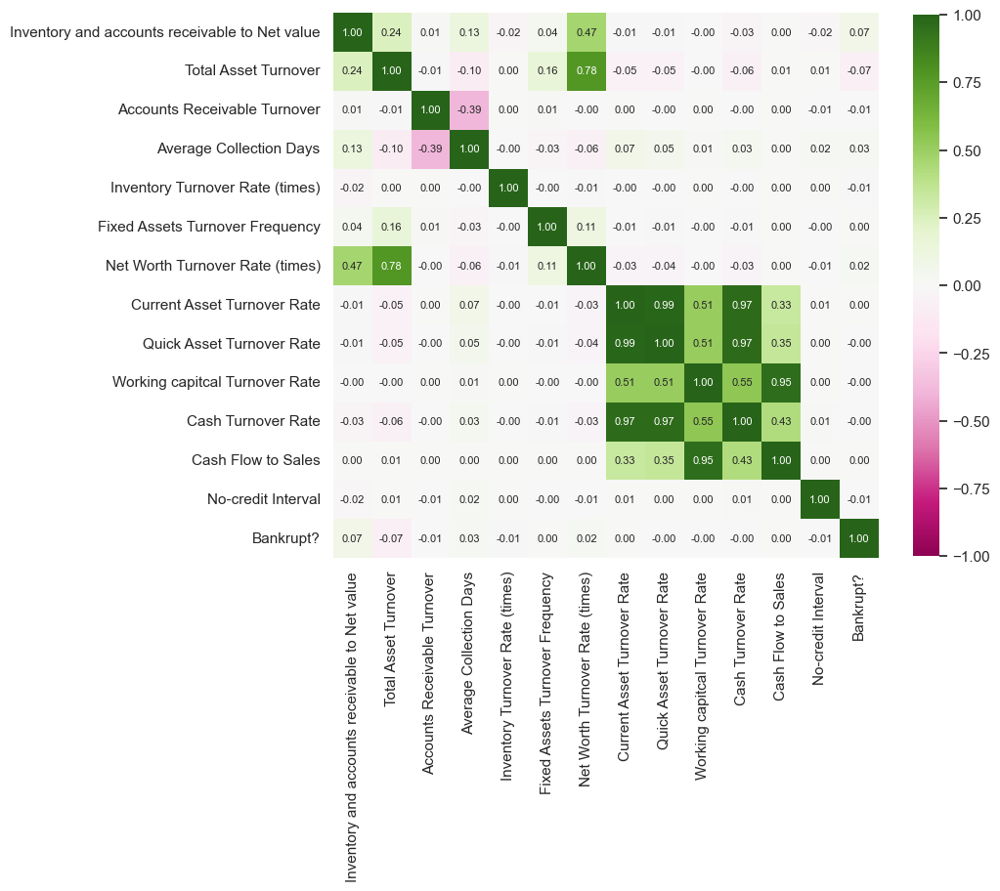

In [81]:
FRheatmap(br_turnover, 9);

<font color=green>`Inventory Turnover Rate (times)`, `Fixed Assets Turnover Frequency`, `Current Asset Turnover Rate`, `Quick Asset Turnover Rate` and `Cash Turnover Rate` have huge numbers of missing values, but their correlations with the target are negligible, so we drop these columns. </font>

<font color=green>Although the formulae for `Working capitcal Turnover Rate` and `Cash Flow to Sales` do not indicate an explicit relationship between these two variables, there is a extremely strong correlation between these two variables and their correlation with the target is negligible. Besides, we have dedicated cash flow ratios. Thus we drop the `Cash Flow to Sales` column. </font>

Drop the above-mentioned columns:

In [82]:
drop_columns = ['Inventory Turnover Rate (times)', 
                'Fixed Assets Turnover Frequency',
                'Current Asset Turnover Rate',
                'Quick Asset Turnover Rate', 
                'Cash Turnover Rate', 
                'Cash Flow to Sales']

In [83]:
br_turnover = br_turnover.drop(drop_columns, axis=1)
br = br.drop(drop_columns, axis=1)

The relationship between `Accounts Receivable Turnover` and `Average Collection Days` is:
$$ \text{Average Collection Days} = \frac{\text{365}}{\text{Accounts Receivable Turnover}} $$

Calculate the product of `Accounts Receivable Turnover` and `Average Collection Days`:

In [84]:
cols = ['Accounts Receivable Turnover', 'Average Collection Days']
test = br_turnover[cols]
product = test['Accounts Receivable Turnover'] * test['Average Collection Days']

The histogram of the product:

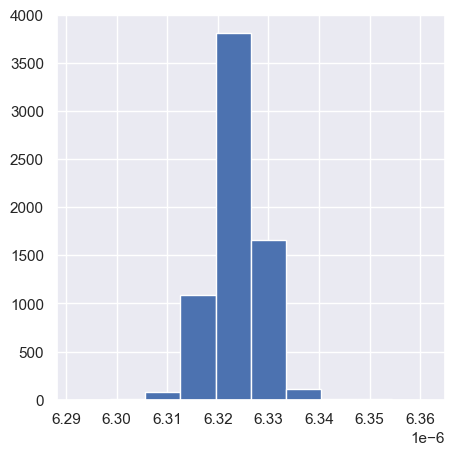

In [85]:
plt.figure(figsize=(5,5))
product[product>0].hist();

<font color = green>This histogram shows that even after normalisation, the product of `Accounts Receivable Turnover` and `Average Collection Days` is approximately a constant. Therefore these two columns virtually represent the same feature. Since `Accounts Receivable Turnover` has more missing values than `Average Collection Days`, it is reasonable to drop the `Accounts Receivable Turnover` column.</font>

Check the descriptive statistics of the rows with missing values in `Average Collection Days`:

In [86]:
br_turnover[br_turnover['Average Collection Days'].isnull()].describe()

,Inventory and accounts receivable to Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Net Worth Turnover Rate (times),Working capitcal Turnover Rate,No-credit Interval,Bankrupt?
count,17.000000,17.000000,17.000000,0.0,17.000000,17.000000,17.000000,17.0
mean,0.407312,0.118617,0.215096,NaN,0.033719,0.593937,0.623462,0.0
std,0.017703,0.120517,0.224830,NaN,0.029675,0.000222,0.005229,0.0
min,0.393663,0.005997,0.065002,NaN,0.009677,0.593281,0.617659,0.0
25%,0.394930,0.026987,0.080592,NaN,0.018871,0.593912,0.621451,0.0
50%,0.398306,0.083958,0.131610,NaN,0.027581,0.593933,0.623613,0.0
75%,0.414245,0.194903,0.254593,NaN,0.042742,0.594071,0.623731,0.0
max,0.447146,0.473763,1.000000,NaN,0.135484,0.594250,0.642120,0.0


<font color = green>All cases are negative. Therefore we can drop the records with missing values while keeping the `Average Collection Days` column.</font>

Drop the `Accounts Receivable Turnover` column:

In [87]:
br_turnover = br_turnover.drop('Accounts Receivable Turnover', axis=1)
br = br.drop('Accounts Receivable Turnover', axis=1)

Drop the records with missing values in `Average Collection Days`:

In [88]:
mask = br_turnover['Average Collection Days'].isnull()
br_turnover = br_turnover[~mask]

Check the correlation again:

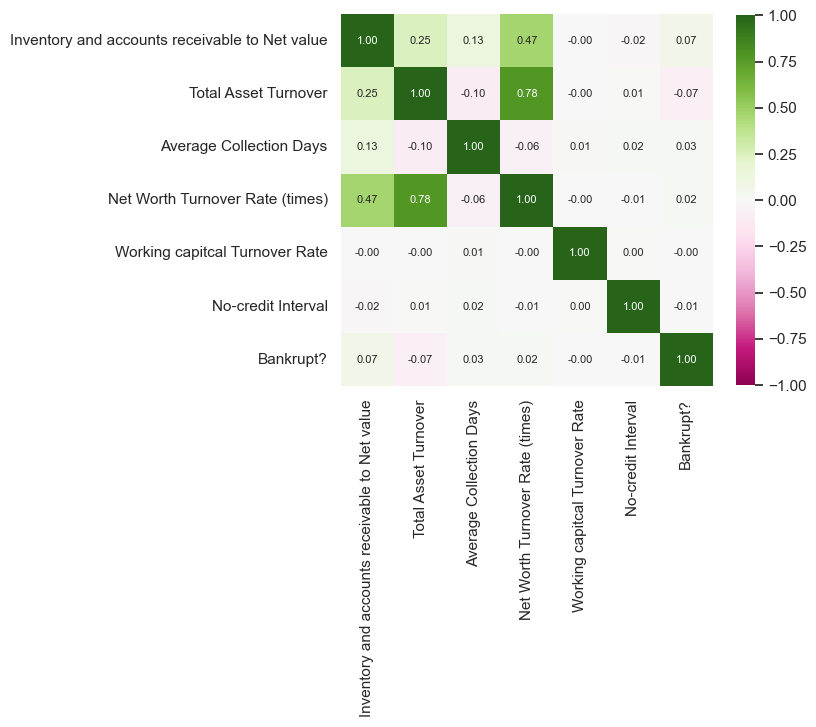

In [89]:
FRheatmap(br_turnover, 6);

Apply the change to the full dataset:

In [90]:
br = br[~mask]

Check the number of features:

In [91]:
br_turnover.shape

(6790, 7)

<font color =  green> After data cleaning and feature engineering we have 6 turnover ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

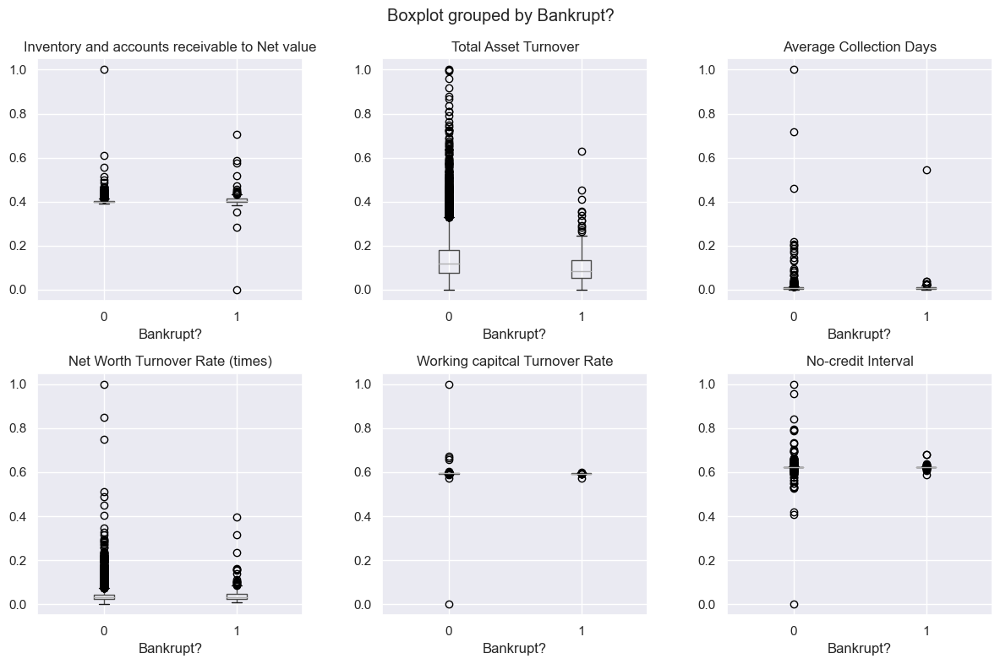

In [92]:
fig, axs = plt.subplots(2, 3, figsize=(12, 8)) 

for column, ax in zip((br_turnover.iloc[:,:-1]).columns, axs.ravel()):
    br_turnover.boxplot(column = column, by = 'Bankrupt?', ax=ax)

fig.tight_layout()
fig.subplots_adjust(hspace=0.3, wspace=0.3);

Save a copy of the dataset at this step:

In [93]:
br_copy_3 = br.copy()

#### 2.0.4 Cash Flow:

Subset the dataframe using cash flow ratios:

In [94]:
cashflow.append('Bankrupt?')

In [95]:
br_cashflow = br[cashflow]
br_cashflow.head()

,Cash flow rate,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Bankrupt?
0,0.458143,0.637555,0.458609,0.520382,0.312905,1
1,0.461867,0.641100,0.459001,0.567101,0.314163,1
2,0.458521,0.642765,0.459254,0.538491,0.314515,1
3,0.465705,0.579039,0.448518,0.604105,0.302382,1
4,0.462746,0.622374,0.454411,0.578469,0.311567,1


Descriptive statistics:

In [96]:
br_cashflow.describe()

,Cash flow rate,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Bankrupt?
count,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000
mean,0.467346,0.649735,0.461791,0.593479,0.315586,0.032106
std,0.014196,0.047407,0.028232,0.058470,0.012984,0.176295
min,0.306652,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.461563,0.633264,0.457113,0.566160,0.312996,0.000000
50%,0.465078,0.645359,0.459749,0.593303,0.314952,0.000000
75%,0.470975,0.663072,0.464236,0.624712,0.317709,0.000000
max,0.743251,1.000000,1.000000,1.000000,1.000000,1.000000


Check the number of missing values in each feature:

In [97]:
br_cashflow.isnull().sum()

Cash flow rate               0
Cash Flow to Total Assets    0
Cash Flow to Liability       0
CFO to Assets                0
Cash Flow to Equity          0
Bankrupt?                    0
dtype: int64

<font color=green> No missing values were found in these columns.</font>

Check the correlation:

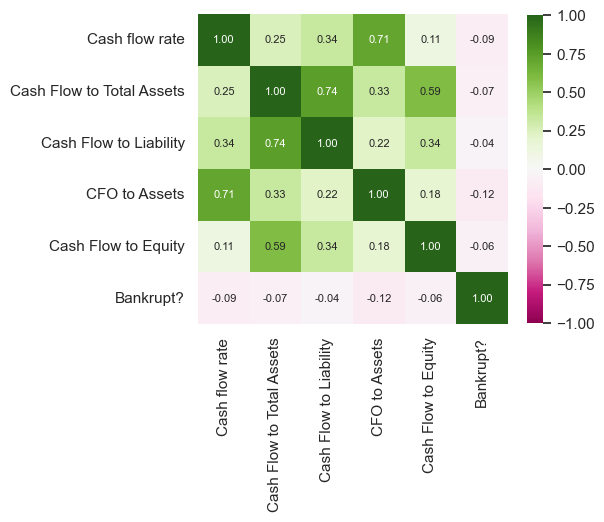

In [98]:
FRheatmap(br_cashflow, 5);

<font color=green>We keep all features in this subset and the full dataset is unchanged.</font>

Boxplot of features showing the seperability of classes using a certain feature:

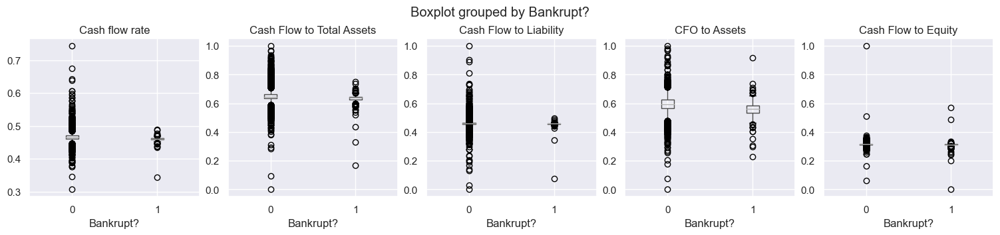

In [99]:
fig, axs = plt.subplots(1, 5, figsize=(15, 3.5)) 

for column, ax in zip(br_cashflow.columns, axs.ravel()):
    br_cashflow.boxplot(column = column, by = 'Bankrupt?', ax=ax)
    
fig.tight_layout(pad=0.5);

#### 2.0.5 Profitability

In [100]:
profitability.append('Bankrupt?')

In [101]:
br_profitability = br[profitability]
br_profitability.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure to revenue,Continuous interest rate (after tax),Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Retained Earnings to Total Assets,Total income to Total expense,Total expense to Assets,Net Income to Total Assets,Gross Profit to Sales,Net Income to Stockholder's Equity,Net Income Flag,Bankrupt?
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,0.169141,0.138736,0.903225,0.002022,0.064856,0.716845,0.601453,0.827890,1,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,0.208944,0.169918,0.931065,0.002226,0.025516,0.795297,0.610237,0.839969,1,1
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,0.180581,0.142803,0.909903,0.002060,0.021387,0.774670,0.601449,0.836774,1,1
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,0.193722,0.148603,0.906902,0.001831,0.024161,0.739555,0.583538,0.834697,1,1
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,0.212537,0.168412,0.913850,0.002224,0.026385,0.795016,0.598782,0.839973,1,1


Descriptive statistics:

In [102]:
br_profitability.describe()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure to revenue,Continuous interest rate (after tax),Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Retained Earnings to Total Assets,Total income to Total expense,Total expense to Assets,Net Income to Total Assets,Gross Profit to Sales,Net Income to Stockholder's Equity,Net Income Flag,Bankrupt?
count,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.0,6790.000000
mean,0.505242,0.558642,0.553634,0.608032,0.608014,0.998759,0.797191,0.809084,0.303618,0.781379,0.228810,0.184365,0.934738,0.002402,0.029177,0.807759,0.608031,0.840392,1.0,0.032106
std,0.060649,0.065617,0.061572,0.015089,0.015069,0.013036,0.012890,0.013626,0.011180,0.012703,0.033284,0.033213,0.025584,0.000534,0.027016,0.040358,0.015089,0.014542,0.0,0.176295
min,0.000000,0.000000,0.000000,0.156308,0.156308,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000772,0.000853,0.000000,0.156309,0.000000,1.0,0.000000
25%,0.476588,0.535557,0.527384,0.600441,0.600428,0.998969,0.797386,0.809312,0.303466,0.781567,0.214711,0.170370,0.931122,0.002236,0.014621,0.796773,0.600439,0.840116,1.0,0.000000
50%,0.502754,0.559802,0.552278,0.605987,0.605951,0.999022,0.797463,0.809375,0.303525,0.781635,0.224544,0.179709,0.937677,0.002336,0.022695,0.810626,0.605984,0.841177,1.0,0.000000
75%,0.535563,0.589184,0.584119,0.613867,0.613779,0.999094,0.797579,0.809469,0.303585,0.781735,0.238820,0.193493,0.944833,0.002491,0.035951,0.826497,0.613863,0.842356,1.0,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,0.999778,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.021153,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


Check the number of missing values in each feature:

In [103]:
br_profitability.isnull().sum()

ROA(C) before interest and depreciation before interest    0
ROA(A) before interest and % after tax                     0
ROA(B) before interest and depreciation after tax          0
Operating Gross Margin                                     0
Realized Sales Gross Margin                                0
Operating Profit Rate                                      0
Pre-tax net Interest Rate                                  0
After-tax net Interest Rate                                0
Non-industry income and expenditure to revenue             0
Continuous interest rate (after tax)                       0
Persistent EPS in the Last Four Seasons                    0
Per Share Net profit before tax (Yuan ¥)                   0
Retained Earnings to Total Assets                          0
Total income to Total expense                              0
Total expense to Assets                                    0
Net Income to Total Assets                                 0
Gross Profit to Sales   

<font color=green> No missing values were found in these columns.</font>

Check the correlation:

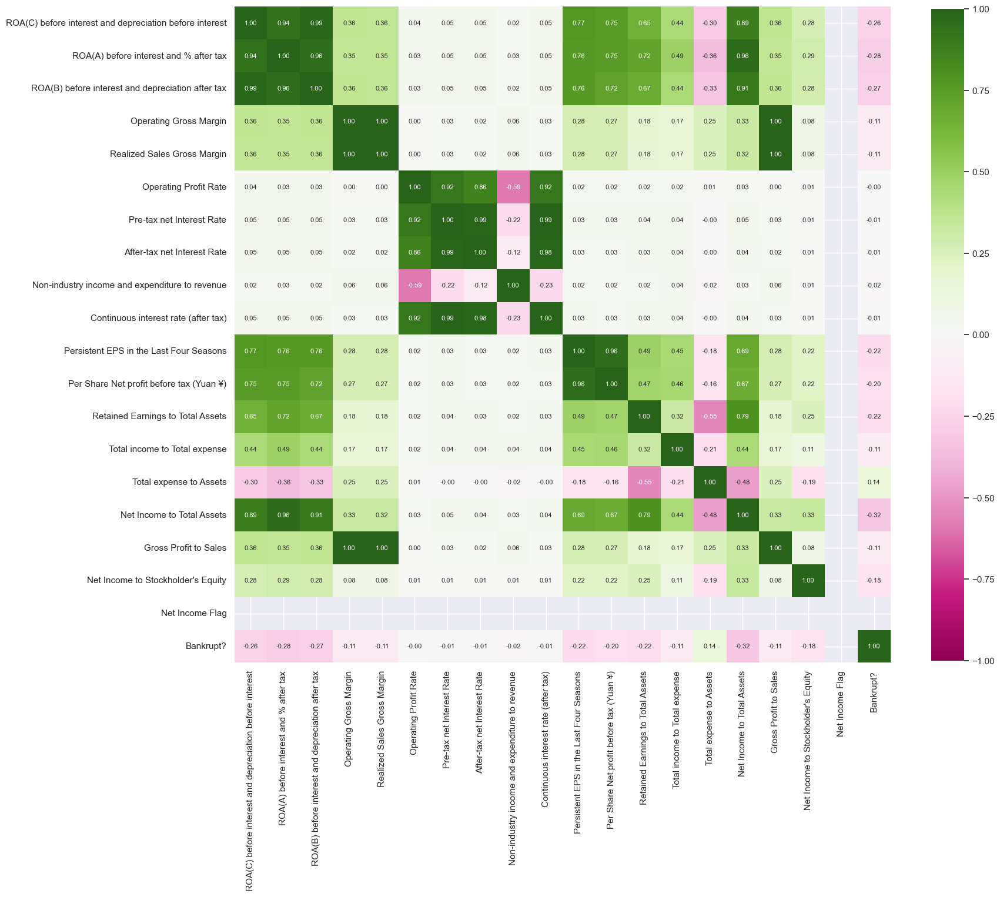

In [104]:
FRheatmap(br_profitability);

<font color = green>There are several problematic columns:
1. <font color = green>`Net Income Flag` has only one value (1) for all instances. This column should be dropped.
2. <font color = green>`Operating Gross Margin`, `Realized Sales Gross Margin` and `Gross Profit to Sales` are all calculated using this formula: $$ \frac{\text{Gross Profit}}{\text{Sales}} $$
<font color = green>We keep `Operating Gross Margin` and drop the other two columns.
3. <font color = green>The difference between `Persistent EPS in the Last Four Seasons` (EPS stands for Earnings per Share) and `Per Share Net profit before tax (Yuan ¥)` is merely the tax rate, thus these two columns has a very strong correlation. Since we have a separate `Tax rate` feature, and `Persistent EPS in the Last Four Seasons` has a higher correlation (in absolute term) with the target than `Per Share Net profit before tax (Yuan ¥)` does, we drop the `Per Share Net profit before tax (Yuan ¥)` column. 
4. <font color = green>Similarily, the difference between `Continuous interest rate (after tax)` and `Continuous interest rate (after tax)` is merely the tax rate. Both columns have only negligible correlation with the target. We drop the `Continuous interest rate (after tax)` column. 
5. <font color = green>`ROA(C) before interest and depreciation before interest`, `ROA(A) before interest and % after tax`, `ROA(B) before interest and depreciation after tax` and `Net Income to Total Assets` show a very strong correlation with each other. The reason is that the fomulae for these four variables are similar: $$ \frac{\text{Earnings}}{\text{Total Assets}} $$
The difference lies in the definition of __Earnings__:  
      - <font color = green>`ROA(C) before interest and depreciation before interest`: Earnings before depreciation and interest (EBITDA) (before tax)  
      - <font color = green>`ROA(A) before interest and % after tax`: Earnings before interest (EBIT = EBITDA - depreciation) after tax  
      - <font color = green>`ROA(B) before interest and depreciation after tax`: EBITDA after tax  
      - <font color = green>`Net Income to Total Assets`: Net profit (EBIT - interest) after tax <br>
<font color = green>Since `Net Income to Total Assets` has the highest correlation with the target, and the difference between these definitions of earnings is represented by other interest and tax related ratios, we drop `ROA(A) before interest and % after tax`, `ROA(B) before interest and depreciation after tax` and `ROA(C) before interest and depreciation before interest`.</font>

Drop above-mentioned columns:

In [105]:
drop_columns = ['Net Income Flag',
                'ROA(C) before interest and depreciation before interest',
                'ROA(A) before interest and % after tax', 
                'ROA(B) before interest and depreciation after tax',
                'Realized Sales Gross Margin',
                'Pre-tax net Interest Rate', 
                'Continuous interest rate (after tax)', 
                'Per Share Net profit before tax (Yuan ¥)', 
                'Gross Profit to Sales']

In [106]:
br_profitability = br_profitability.drop(drop_columns, axis=1)
br = br.drop(drop_columns, axis=1)

Check the correlation again:

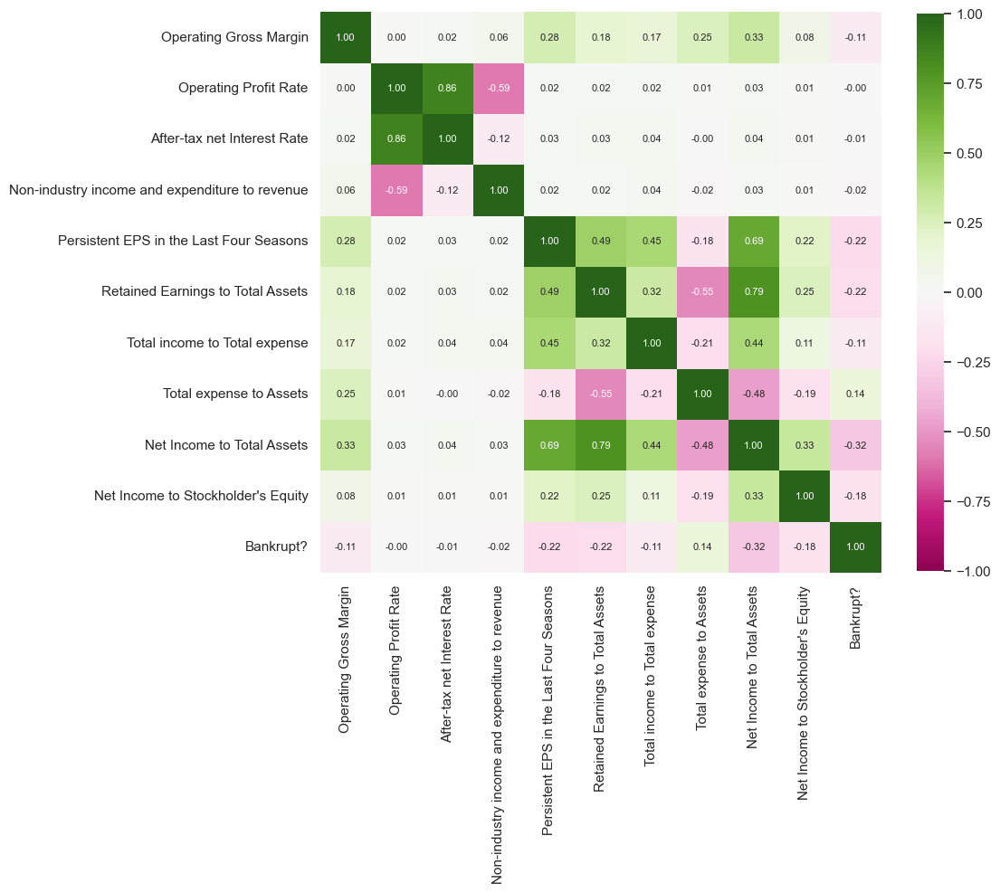

In [107]:
FRheatmap(br_profitability, 10);

Check the number of features:

In [108]:
br_profitability.shape

(6790, 11)

<font color =  green> After data cleaning and feature engineering we have 10 profitability ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

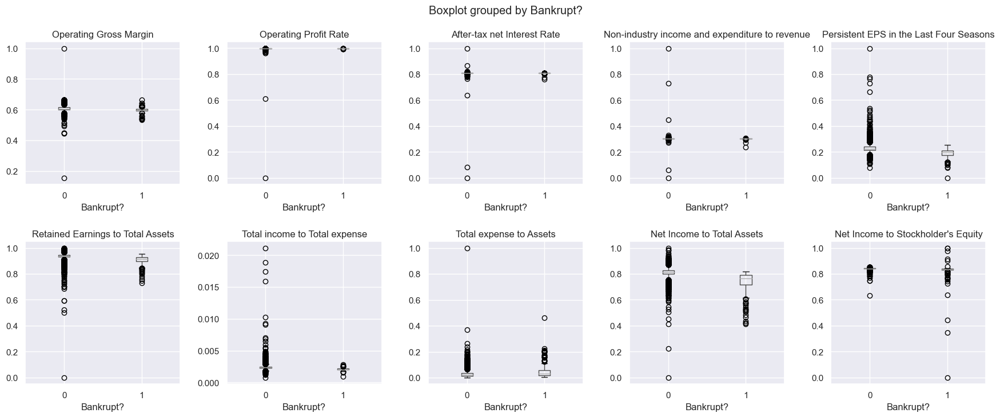

In [109]:
fig, axs = plt.subplots(2, 5, figsize=(21,8)) 

for column, ax in zip((br_profitability.iloc[:,:-1]).columns, axs.ravel()):
    br_profitability.boxplot(column = column, by = 'Bankrupt?', ax=ax)

fig.subplots_adjust(hspace=0.4, wspace=0.3);

Save a copy of the dataset at this step:

In [110]:
br_copy_4 = br.copy()

#### 2.0.6 Growth

Subset the dataframe using growth ratios:

In [111]:
growth.append('Bankrupt?')

In [112]:
br_growth = br[growth]
br_growth.head()

,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Continuous Net Profit Growth Rate,Regular Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Bankrupt?
0,0.022102,0.848195,0.688979,0.217535,0.688979,NaN,0.000327,0.263100,1
1,0.022080,0.848088,0.689693,0.217620,0.689702,NaN,0.000443,0.264516,1
2,0.022760,0.848094,0.689463,0.217601,0.689470,NaN,0.000396,0.264184,1
3,0.022046,0.848005,0.689110,0.217568,0.689110,NaN,0.000382,0.263371,1
4,0.022096,0.848258,0.689697,0.217626,0.689697,NaN,0.000439,0.265218,1


In [113]:
br_growth.describe()

,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Continuous Net Profit Growth Rate,Regular Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Bankrupt?
count,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,796.000000,6789.000000,6790.000000,6790.000000
mean,0.022409,0.847982,0.689148,0.217640,0.689156,0.001532,0.000689,0.264249,0.032106
std,0.012105,0.010774,0.013869,0.010084,0.013930,0.035550,0.012284,0.009654,0.176295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.022065,0.847984,0.689270,0.217579,0.689270,0.000108,0.000441,0.263759,0.000000
50%,0.022102,0.848043,0.689439,0.217598,0.689439,0.000122,0.000462,0.264050,0.000000
75%,0.022153,0.848123,0.689648,0.217622,0.689648,0.000151,0.000499,0.264389,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Check the number of missing values in each feature:

In [114]:
br_growth.isnull().sum()

Realized Sales Gross Profit Growth Rate       0
Operating Profit Growth Rate                  0
After-tax Net Profit Growth Rate              0
Continuous Net Profit Growth Rate             0
Regular Net Profit Growth Rate                0
Total Asset Growth Rate                    5994
Net Value Growth Rate                         1
Total Asset Return Growth Rate Ratio          0
Bankrupt?                                     0
dtype: int64

Check the correlation:

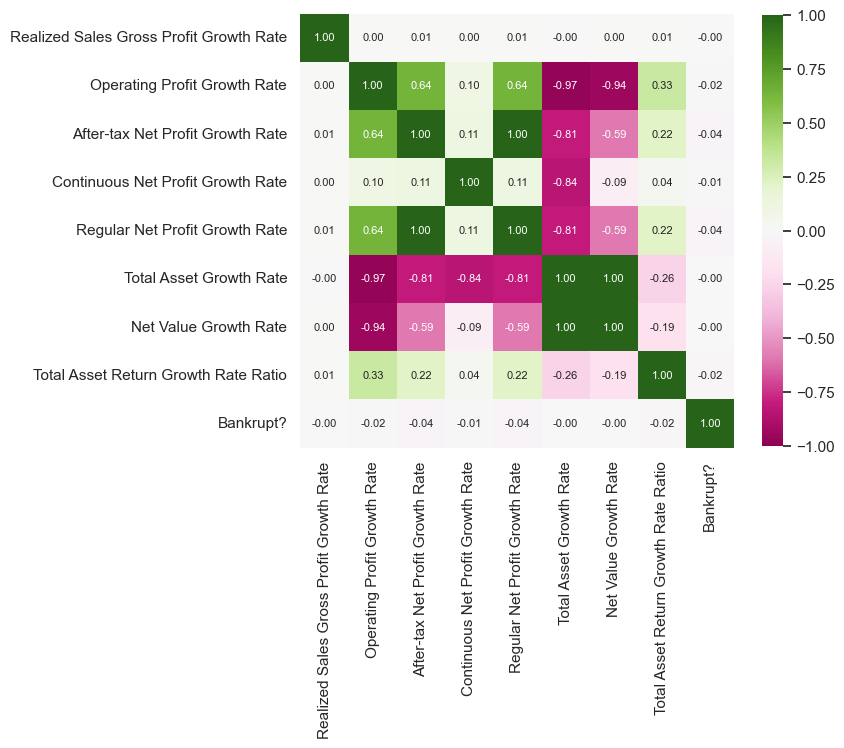

In [115]:
FRheatmap(br_growth, 7);

<font color=green>The `Total Asset Growth Rate` column has huge numbers of missing values. The `Net Value Growth Rate` column has 2 missing values and a very strong negative correlation with `Operating Profit Growth Rate`. These two columns should be dropped.

<font color=green>The difference between `After-tax Net Profit Growth Rate` and `Regular Net Profit Growth Rate` is almost zero, which is proved by the perfect correlation between these two variables. We drop the `Regular Net Profit Growth Rate` column.</font>

Drop the above-mentioned columns:

In [116]:
drop_columns = ['Total Asset Growth Rate',
                'Net Value Growth Rate',
                'Regular Net Profit Growth Rate']

In [117]:
br_growth = br_growth.drop(drop_columns, axis=1)
br = br.drop(drop_columns, axis=1)

Check the correlation again:

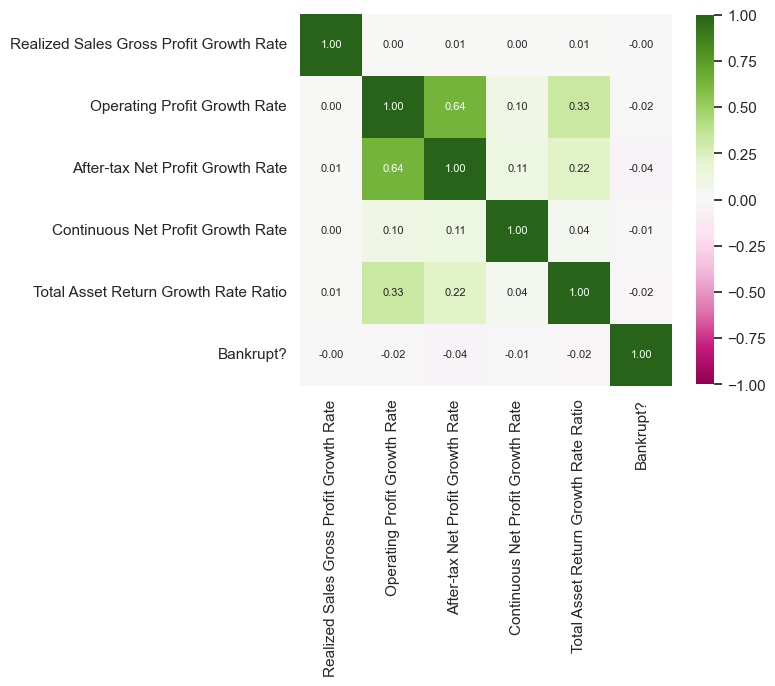

In [118]:
FRheatmap(br_growth, 6);

Check the number of features:

In [119]:
br_growth.shape

(6790, 6)

<font color =  green> After data cleaning and feature engineering we have 5 growth ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

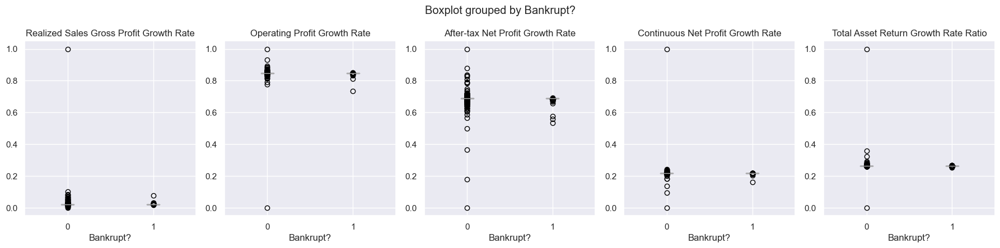

In [120]:
fig, axs = plt.subplots(1, 5, figsize=(18,4.5))

for column, ax in zip(br_growth.columns, axs.ravel()):
    br_growth.boxplot(column = column, by = 'Bankrupt?', ax=ax)
                        
fig.tight_layout(pad=1.0);

Save a copy of the dataset at this step:

In [121]:
br_copy_5 = br.copy()

#### 2.0.7 Others

Subset the dataframe using others ratios:

In [122]:
others.append('Bankrupt?')

In [123]:
br_others = br[others]
br_others.head()

,Operating Expense Rate,Research and development expense rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Revenue per person,Operating profit per person,Allocation rate per person,Total assets to GNP price,Bankrupt?
0,0.000126,0.0,0.0,0.147950,0.147950,0.147950,0.311664,0.017560,0.095921,0.034164,0.392913,0.037135,0.009219,1
1,0.000290,0.0,0.0,0.182251,0.182251,0.182251,0.318137,0.021144,0.093722,0.006889,0.391590,0.012335,0.008323,1
2,0.000236,NaN,0.0,0.177911,0.177911,0.193713,0.307102,0.005944,0.092338,0.028997,0.381968,0.141016,0.040003,1
3,0.000108,0.0,0.0,0.154187,0.154187,0.154187,0.321674,0.014368,0.077762,0.015463,0.378497,0.021320,0.003252,1
4,NaN,0.0,0.0,0.167502,0.167502,0.167502,0.319162,0.029690,0.096898,0.058111,0.394371,0.023988,0.003878,1


In [124]:
br_others.describe()

,Operating Expense Rate,Research and development expense rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Revenue per person,Operating profit per person,Allocation rate per person,Total assets to GNP price,Bankrupt?
count,4512.000000,2759.000000,6790.000000,6790.000000,6790.000000,6790.000000,6790.000000,6786.000000,6790.000000,6788.000000,6790.000000,6779.000000,6770.000000,6790.000000
mean,0.000632,0.000551,0.115232,0.190668,0.190641,0.190680,0.323515,0.039064,0.109115,0.035388,0.400557,0.015951,0.008679,0.032106
std,0.016003,0.019050,0.138816,0.033393,0.033478,0.033484,0.017574,0.045265,0.027974,0.055671,0.031746,0.039772,0.034036,0.176295
min,0.000100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000136,0.000000,0.000000,0.173613,0.173613,0.173697,0.317783,0.015673,0.096165,0.010446,0.392441,0.004121,0.000898,0.000000
50%,0.000181,0.000000,0.074704,0.184400,0.184400,0.184421,0.322487,0.027391,0.104226,0.018604,0.395909,0.007819,0.002069,0.000000
75%,0.000276,0.000187,0.206068,0.199570,0.199602,0.199612,0.328641,0.046384,0.116196,0.035747,0.401845,0.014861,0.005228,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Check the number of missing values in each feature:

In [125]:
br_others.isnull().sum()

Operating Expense Rate                   2278
Research and development expense rate    4031
Tax rate (A)                                0
Net Value Per Share (B)                     0
Net Value Per Share (A)                     0
Net Value Per Share (C)                     0
Cash Flow Per Share                         0
Revenue Per Share (Yuan ¥)                  4
Operating Profit Per Share (Yuan ¥)         0
Revenue per person                          2
Operating profit per person                 0
Allocation rate per person                 11
Total assets to GNP price                  20
Bankrupt?                                   0
dtype: int64

Check the correlation:

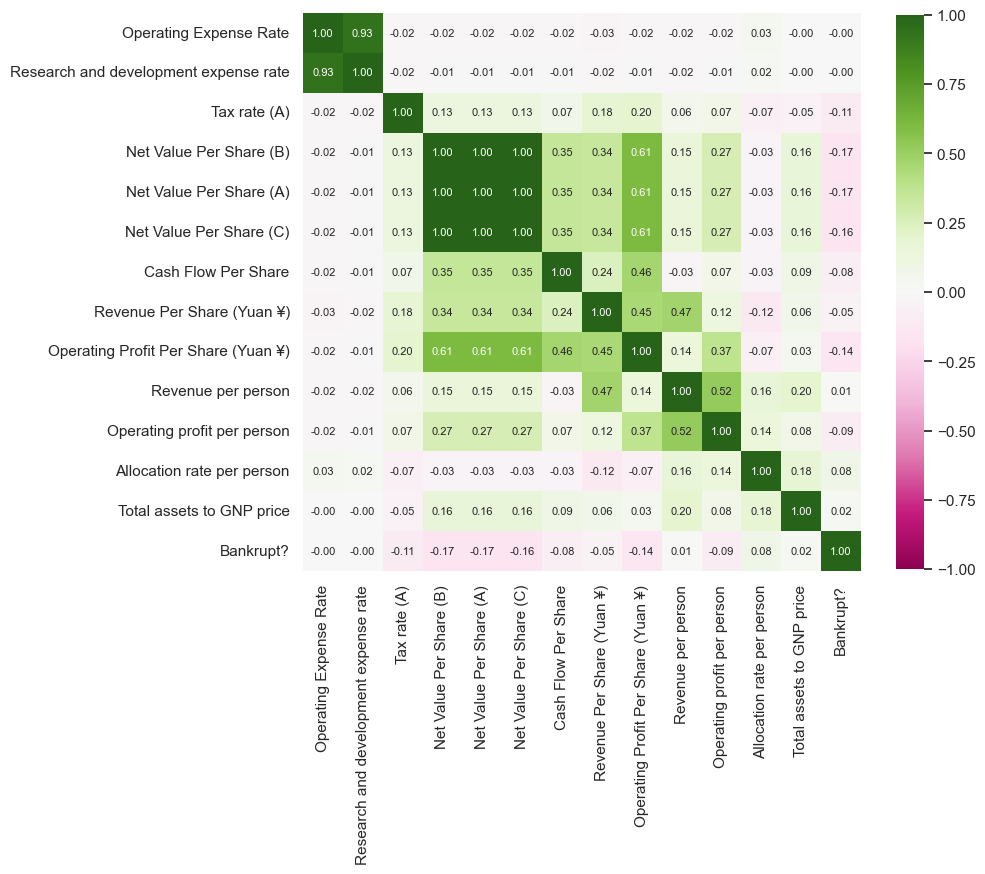

In [126]:
FRheatmap(br_others, 9)

<font color=green> `Operating Expense Rate` and `Research and development expense rate` have huge numbers of missing values. These two columns should be dropped. <br>
<font color=green> `Revenue Per Share (Yuan ¥)`, `Revenue per person`, `Allocation rate per person` and `Total assets to GNP price` also have some missing values, and their correlations with the target is negligible, we drop these columns.</font>
<font color=green>`Net Value Per Share (B)`, `Net Value Per Share (A)` and `Net Value Per Share (C)` show a perfect positive correlation between each other. Only one of these columns should be kept. We drop `Net Value Per Share (B)` and `Net Value Per Share (A)`. </font>

Drop the above-mentioned columns:

In [127]:
drop_columns = ['Operating Expense Rate', 
                'Research and development expense rate', 
                'Revenue Per Share (Yuan ¥)', 
                'Revenue per person',
                'Allocation rate per person', 
                'Total assets to GNP price',
                'Net Value Per Share (B)', 
                'Net Value Per Share (A)']

In [128]:
br_others = br_others.drop(drop_columns, axis=1)
br = br.drop(drop_columns, axis=1)

Check the correlation again:

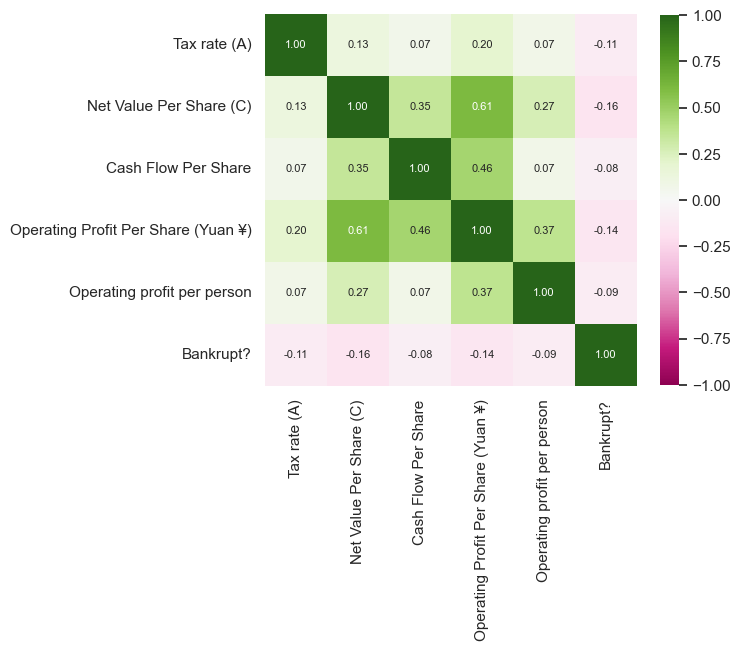

In [129]:
FRheatmap(br_others, 6)

Check the number of features:

In [130]:
br_others.shape

(6790, 6)

<font color =  green> After data cleaning and feature engineering we have 5 others ratios as predictors. </font>

Boxplot of features showing the seperability of classes using a certain feature:

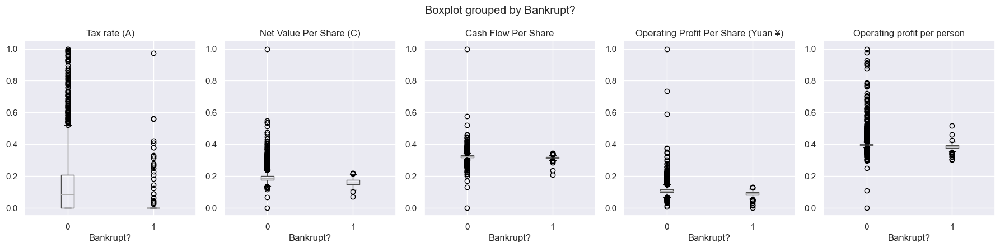

In [131]:
fig, axs = plt.subplots(1, 5, figsize=(18,4.5))

for column, ax in zip((br_others.iloc[:,:-1]).columns, axs.ravel()):
    br_others.boxplot(column = column, by = 'Bankrupt?', ax=ax)

fig.tight_layout(pad=1.0);

Save a copy of the dataset at this step:

In [132]:
br_copy_6 = br.copy()

### 2.1 EDA on the full dataset

Check the pairwise correlation:

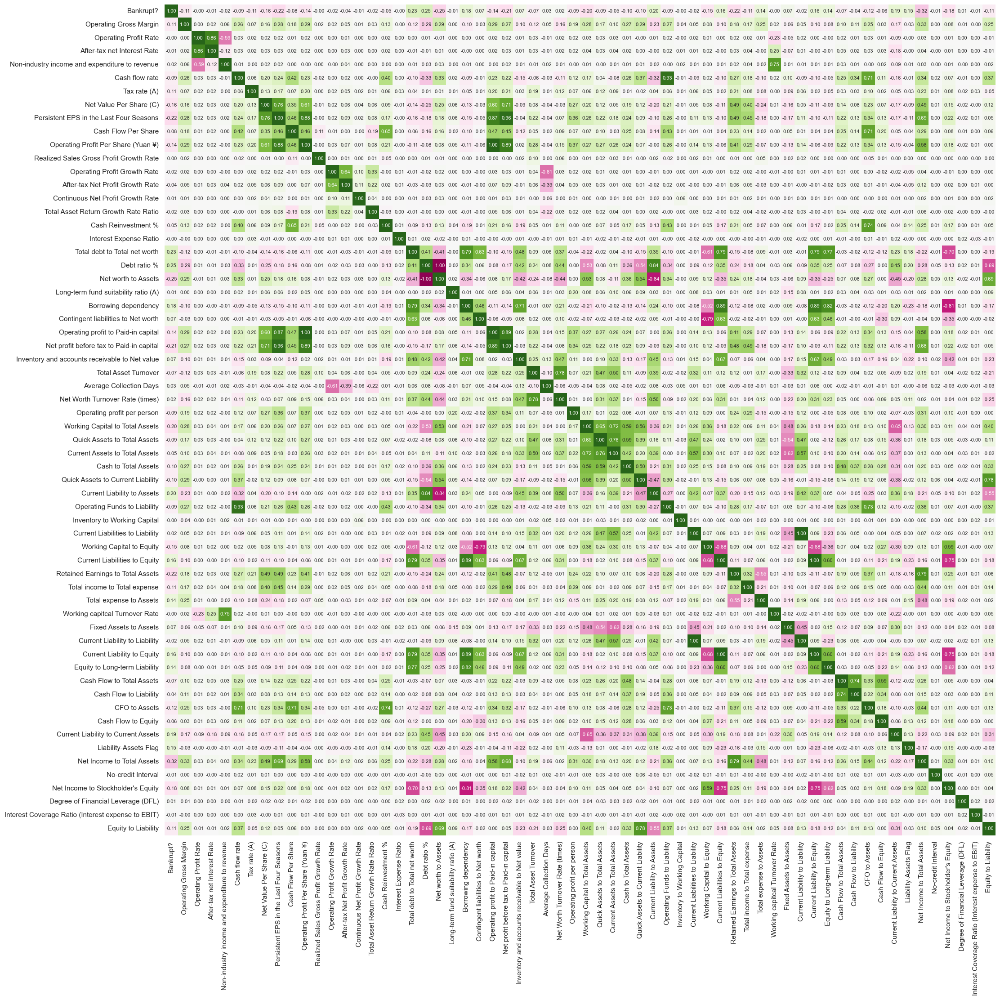

In [133]:
FRheatmap(br, size=24, annot_size=6, cbar=False)

<font color=green>Putting all features together, we can see some ratios belonging to different ratio category have perfect correlation:  
    
| Feature pairs | Correlation | Relationship | Treatment |
| :-: | :-: | :-: | :-: |
|`Debt ratio %` and `Net Worth to Assets` | -1.00 | `Debt ratio %` + `Net Worth to Assets` = 1 | drop `Debt ratio %`  |
|`Operating profit Per Share` and `Operating profit to Paid-in capital` | 1.00 | virtually the same | drop `Operating profit to Paid-in capital`  |
|`Current Liabilities to Liability` and `Current Liability to Liability` | 1.00 | virtually the same | drop `Current Liability to Liability`  |
|`Current Liabilities to Equity` and `Current Liability to Equity` | 1.00 | virtually the same | drop `Current Liability to Equity`  |</font>

Drop the above-mentioned columns:

In [134]:
drop_columns = ['Debt ratio %', 
                'Operating profit to Paid-in capital',
                'Current Liability to Liability',
                'Current Liability to Equity']

In [135]:
br = br.drop(drop_columns, axis=1)

Check the correlation again:

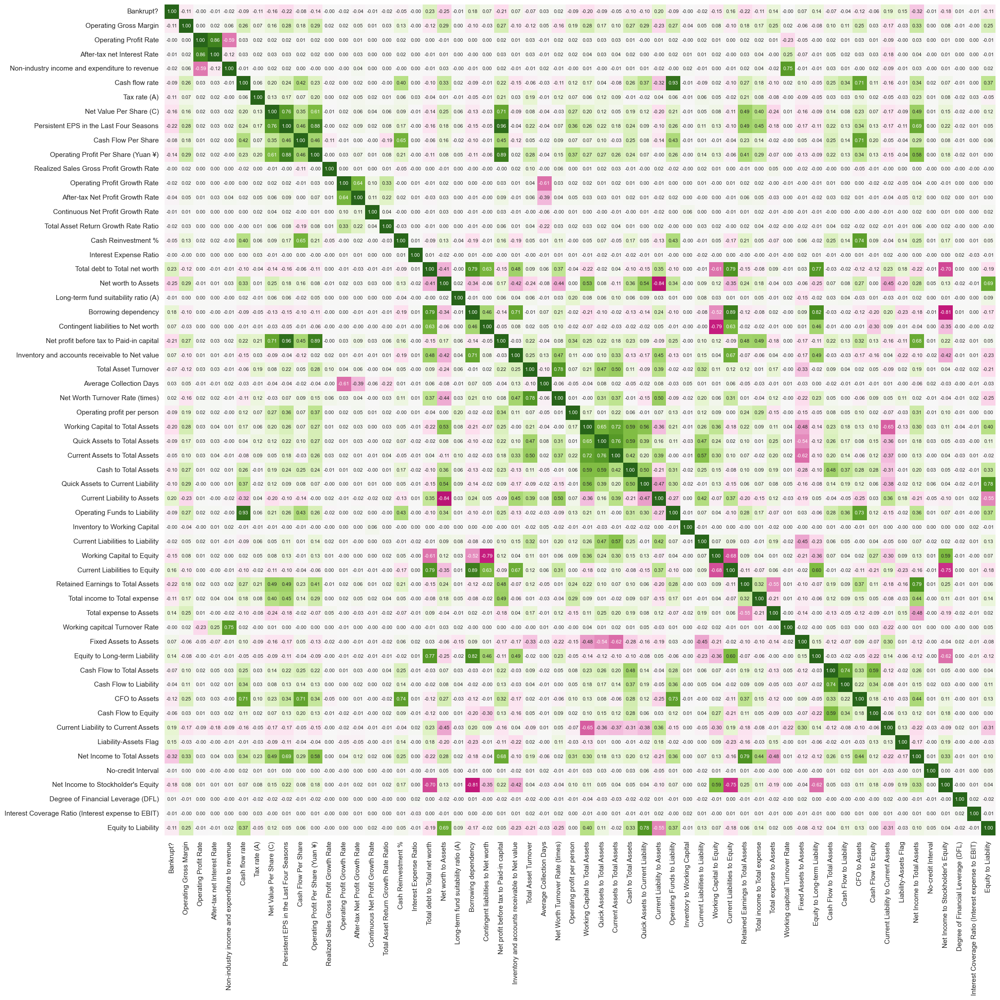

In [136]:
FRheatmap(br, size=24, annot_size=6, cbar=False)
plt.savefig('corr_full.png')

Check the number of features:

In [137]:
br.shape

(6790, 58)

<font color = green>After data cleaning and feature engineering, the number of features decreases from 95 to 57.</font>

The correlation between the target and each feature:

In [138]:
br_corr = pd.DataFrame(br.corrwith(br['Bankrupt?']))
br_corr.columns = ['Correlation']
br_corr['Abs_corr'] = np.abs(br_corr['Correlation'])
br_corr = br_corr.sort_values('Abs_corr', ascending = False)

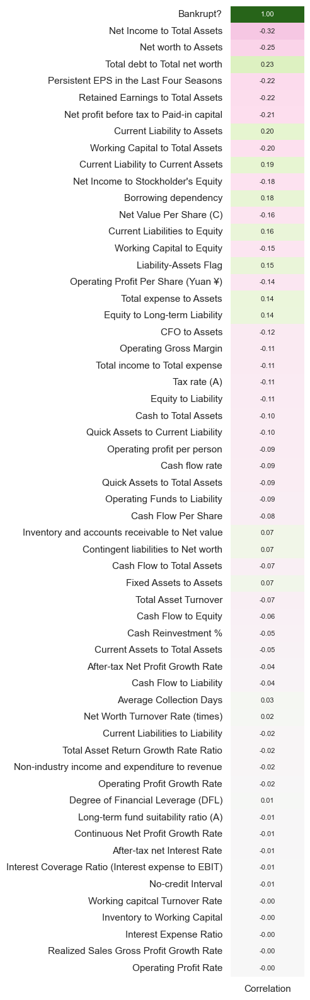

In [139]:
sns.set(rc={'figure.figsize':(1.5, 20)})
sns.heatmap(br_corr[['Correlation']], vmin = -1.0, vmax = 1.0, center = 0.0, annot = True, fmt=".2f", cbar = False, cmap = 'PiYG', annot_kws={"size":8}); 

The 15 highest correlations with the target:

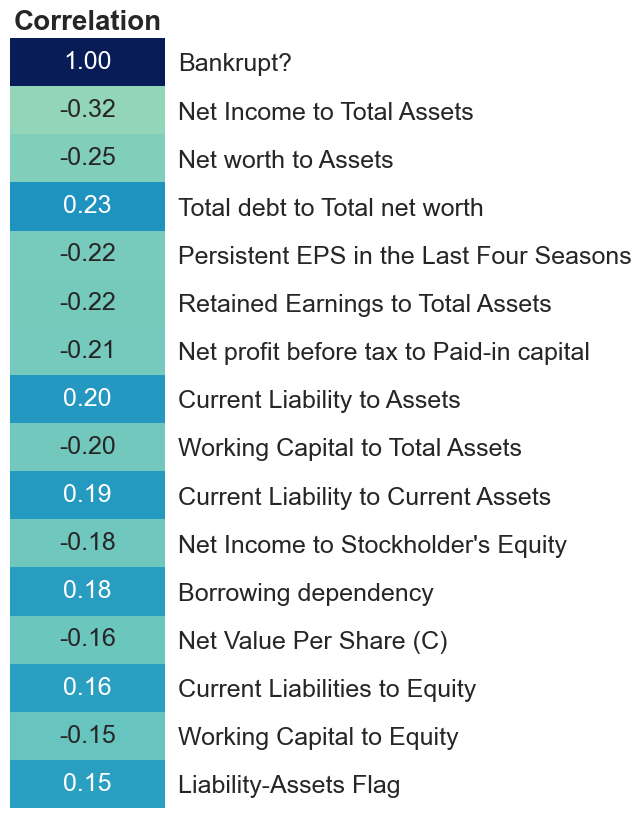

In [140]:
sns.set(rc={'figure.figsize':(2, 10)})
ax = sns.heatmap(br_corr[['Correlation']].head(16), 
                 vmin = -1.0, 
                 vmax = 1.0, 
                 center = 0.0, 
                 annot = True, 
                 fmt=".2f", 
                 cbar = False, 
                 cmap = 'YlGnBu', 
                 annot_kws={"size":18})
ax.set_title('Correlation', fontdict={'size': 20, 'weight': 'bold'})
ax.set_xticklabels([])
ax.tick_params(labelleft = False, labelright=True, rotation=0)
ax.yaxis.set_tick_params(labelsize=18); 
plt.savefig('top_corr.png', bbox_inches = 'tight')

Map the top 15 features to their categories:

In [141]:
categories = [solvency, capital_structure, turnover, cashflow, profitability, growth, others]
cat_names = ['Solvency', 'Capital structure', 'Turnover', 'Cash flow', 'Profitability', 'Growth', 'Others']

In [142]:
top_features = [*br_corr[['Correlation']].head(16).index]
top_features = top_features[1:]

In [143]:
top_cat_ls =[]

for feature in top_features:
    for cat, name in zip(categories, cat_names):
        if feature in cat:
            top_cat_ls.append(name)
            break 

In [144]:
top_fs_df = pd.DataFrame(columns=['feature','category'])
top_fs_df['feature']=top_features
top_fs_df['category']=top_cat_ls

In [145]:
top_fs_df

,feature,category
0,Net Income to Total Assets,Profitability
1,Net worth to Assets,Capital structure
2,Total debt to Total net worth,Solvency
3,Persistent EPS in the Last Four Seasons,Profitability
4,Retained Earnings to Total Assets,Profitability
5,Net profit before tax to Paid-in capital,Solvency
6,Current Liability to Assets,Solvency
7,Working Capital to Total Assets,Solvency
8,Current Liability to Current Assets,Solvency
9,Net Income to Stockholder's Equity,Profitability


Check the pairwise seperability of classes using the 10 features with the highest correlation with the target:

In [146]:
top_features = br_corr[['Correlation']].head(11).index

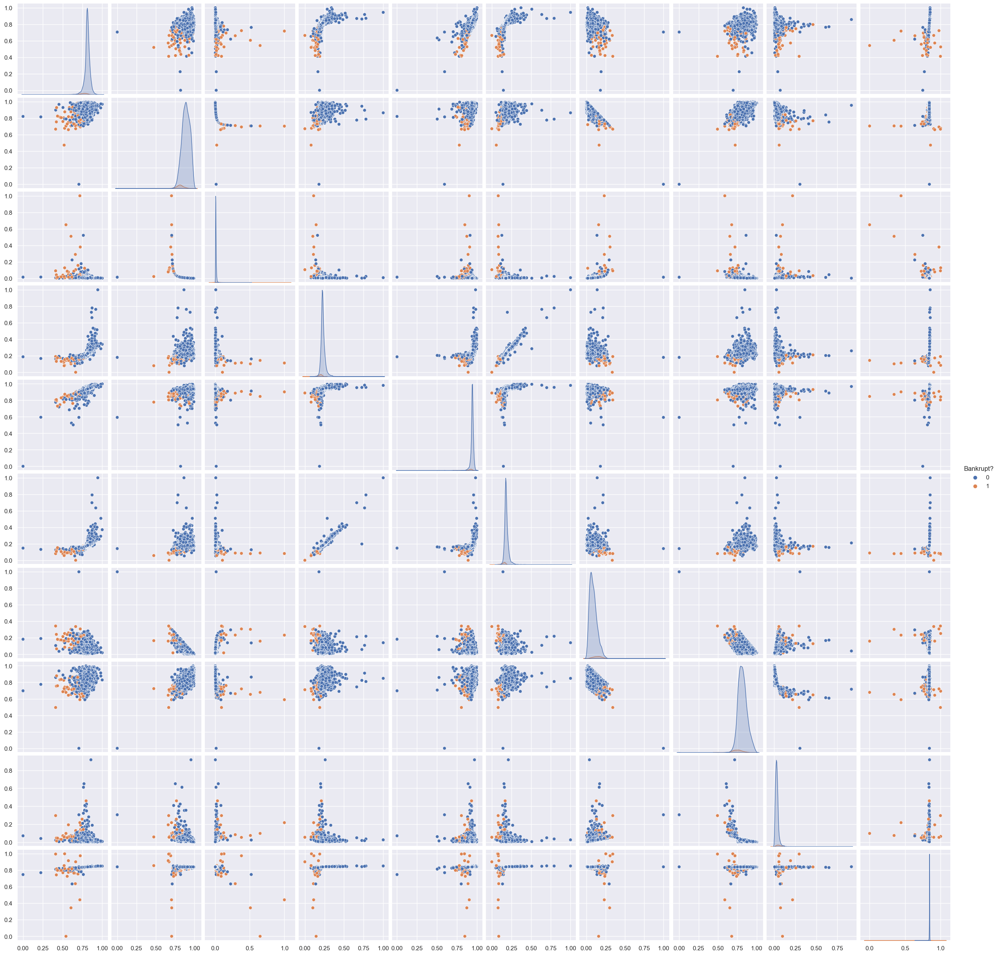

In [147]:
g = sns.pairplot(br[[*top_features]], hue='Bankrupt?')
g.set(xlabel=None)
g.set(ylabel=None);

<font color=green> The pairwise separability looks optimistic.</font>

Check the label distribution:

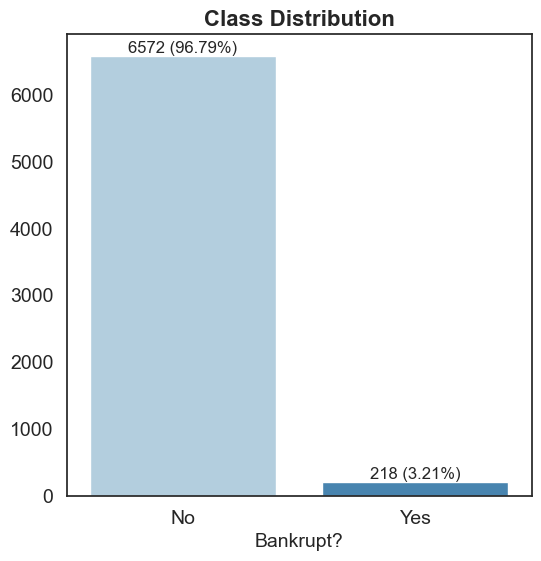

In [148]:
sns.set(rc={'figure.figsize':(6,6)})
sns.set_style('white')

ax = sns.countplot(br, x = 'Bankrupt?', palette='Blues')
abs_values = br['Bankrupt?'].value_counts(ascending=False)
rel_values = br['Bankrupt?'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.2f}%)' for p in zip(abs_values, rel_values)]
ax.set_xlabel('Bankrupt?', fontsize=14)
ax.set_ylabel('')
ax.set_xticklabels(['No','Yes'], fontsize=14)
ax.yaxis.set_tick_params(labelsize=14)
ax.bar_label(container=ax.containers[0], labels=lbls)
ax.set_title('Class Distribution', fontdict={'size':16, 'weight':'bold'});

plt.savefig('imba.png')

<font color=green>The data cleaning process does not perturb the distribution of the label.</font>

Save a copy and write the dataframe to csv file for modelling:

In [149]:
br_copy_f = br.copy()
br.to_csv('Bankruptcy.csv')

### 2.2 2D-Visualisation of high dimensional dataset

Our dataset has high dimensions. The hidden patterns in the data cannot be easily identified by visual observation. To achieve the visualization of high-dimensional data, dimensionality reduction is required.  
T-distributed Stochastic Neighbor Embedding (__t-SNE__) and Uniform Manifold Approximation and Projection (__UMAP__) are two state-of-the-art dimensionality reduction techniques for data exploration and visualizing high-dimensional data, which give a feel and intuition on how data is arranged in higher dimensions. They are often used to visualize complex datasets into two and three dimensions, allowing us to understand more about underlying patterns and relationships in the data.  
t-SNE and UMAP have the same principle and workflow: create a high dimensional graph, then reconstruct it in a lower dimensional space while retaining the structure.  
The main difference between t-SNE and UMAP is the interpretation of the distance between objects or "clusters".  
>Note:We use _supervised_ t-SNE and UMAP for visualisation. 

#### 2.2.0 t-Distributed Stochastic Neighbor Embedding (t-SNE) Visualisation

Fit t-SNE and transform the data into 2 dimensions: 

In [150]:
from sklearn.manifold import TSNE

In [151]:
features = br.iloc[:,:-1]
label = br['Bankrupt?']
features_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=50).fit_transform(features, label)

Check the output dimensionality:

In [152]:
features_embedded.shape

(6790, 2)

Combine the t-SNE components with the target:

In [153]:
features_embedded_df = pd.DataFrame(features_embedded, columns = ['TSNE1', 'TSNE2'])
features_embedded_df = pd.concat([features_embedded_df, br['Bankrupt?'].reset_index()], axis=1)
features_embedded_df.drop('index', axis=1, inplace=True)
features_embedded_df.head()

,TSNE1,TSNE2,Bankrupt?
0,50.016079,-42.024944,1
1,47.266281,-42.056728,1
2,53.258492,-36.886738,1
3,49.757263,-42.853119,1
4,54.788589,-40.748848,1


Visualize two t-SNE components on a scatter plot:

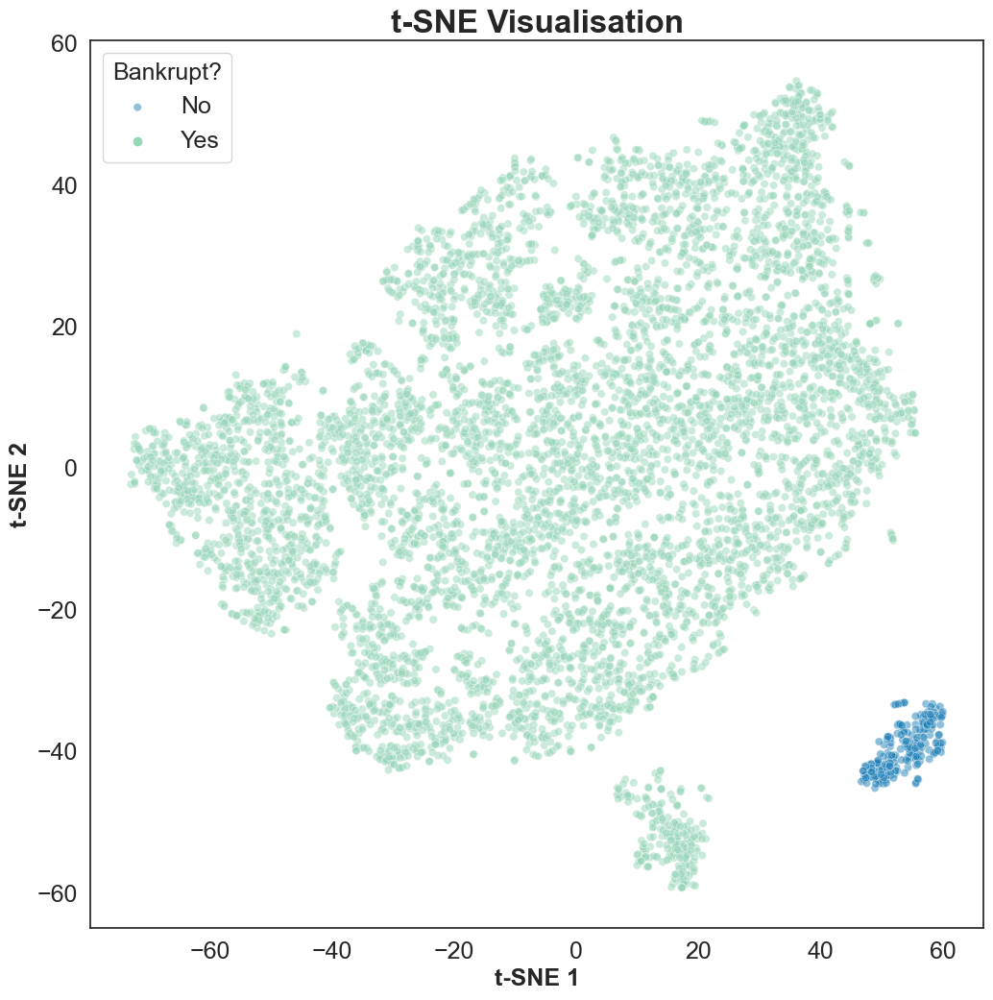

In [160]:
sns.set(rc={'figure.figsize':(12, 12)})
sns.set_style('white')

sns.scatterplot(features_embedded_df, x='TSNE1', y='TSNE2', hue='Bankrupt?', alpha=0.5, palette = 'YlGnBu')
plt.title('t-SNE Visualisation', fontdict={'size': 24, 'weight': 'bold'})
plt.legend(labels=['No', 'Yes'], title = 'Bankrupt?', fontsize=18, title_fontsize=18)
ax=plt.gca()
ax.set_xlabel('t-SNE 1', fontdict={'size': 18, 'weight': 'bold'})
ax.set_ylabel('t-SNE 2', fontdict={'size': 18, 'weight': 'bold'})
ax.xaxis.set_tick_params(labelsize=18)
ax.yaxis.set_tick_params(labelsize=18);

plt.savefig('tsne.png')

#### 2.2.1 Uniform Manifold Approximation and Projection (UMAP) Visualisation

Fit UMAP and transform the data into 2 dimensions: 

In [155]:
import umap.umap_ as umap

In [156]:
manifold = umap.UMAP().fit(features, label)
features_reduced = manifold.transform(features)

Check the output dimensionality:

In [157]:
features_reduced.shape

(6790, 2)

Combine the UMAP components with the target:

In [158]:
features_reduced_df = pd.DataFrame(features_reduced, columns = ['UMAP1', 'UMAP2'])
features_reduced_df = pd.concat([features_reduced_df, label.reset_index()], axis=1)
features_reduced_df.head()

,UMAP1,UMAP2,index,Bankrupt?
0,18.297958,3.426084,0,1
1,18.042126,3.528636,1,1
2,18.996262,3.583560,2,1
3,18.245163,3.418284,3,1
4,18.912010,3.267120,4,1


Visualize two UMAP components on a scatter plot:

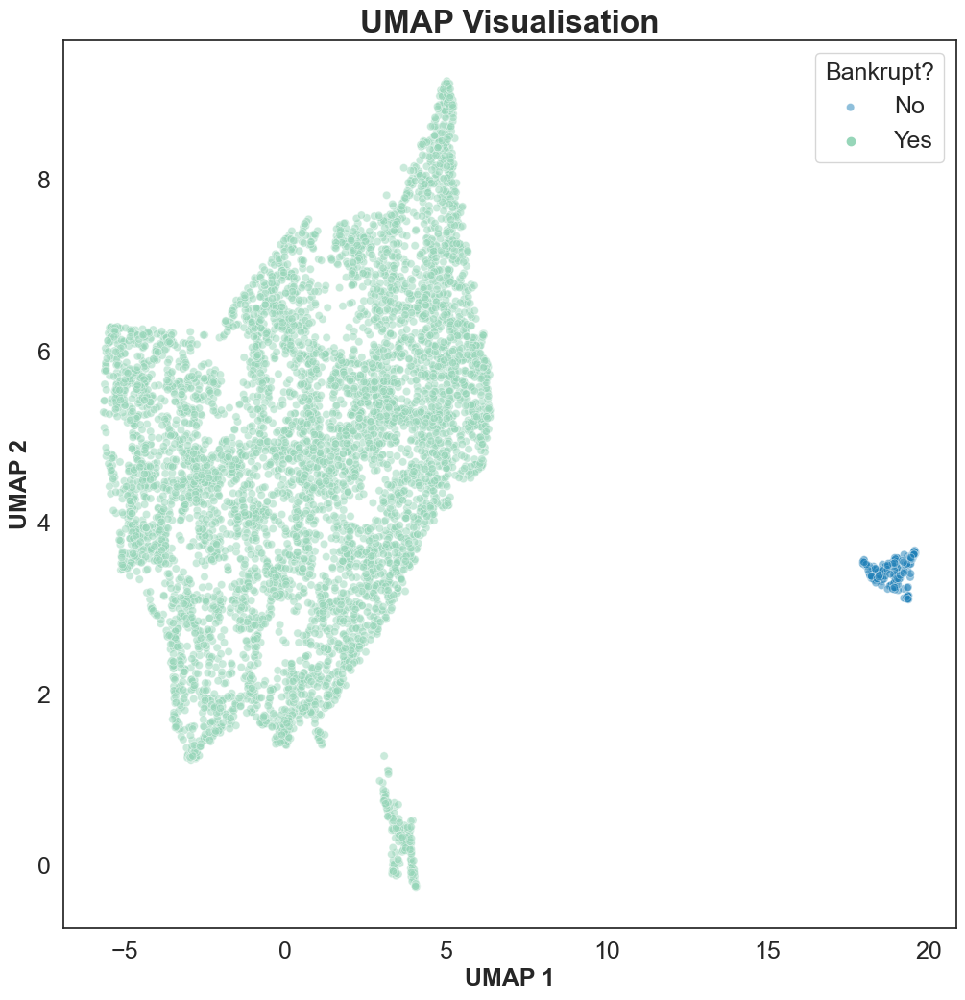

In [159]:
sns.set(rc={'figure.figsize':(12, 12)})
sns.set_style('white')

sns.scatterplot(features_reduced_df, x='UMAP1', y='UMAP2', hue='Bankrupt?', alpha=0.5, palette = 'YlGnBu')
plt.title('UMAP Visualisation', fontdict={'size': 24, 'weight': 'bold'})
plt.legend(labels=['No', 'Yes'], title = 'Bankrupt?', fontsize=18, title_fontsize=18)
ax=plt.gca()
ax.set_xlabel('UMAP 1', fontdict={'size': 18, 'weight': 'bold'})
ax.set_ylabel('UMAP 2', fontdict={'size': 18, 'weight': 'bold'})
ax.xaxis.set_tick_params(labelsize=18)
ax.yaxis.set_tick_params(labelsize=18);

plt.savefig('umap.png');

<font color = 'blue'>Both visualisations show clearly separated clusters of classes. The important structural properties of the data have been retained while the classes have been cleanly pulled apart and isolated. </font>